In [8]:
#Data processing
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nptdms import TdmsFile #Process ramping file

#For building ML models
import keras
import keras.models as models
from keras.layers.core import Dense
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.signal import find_peaks

np.random.seed(1337) # for reproducibility

In [14]:
def load_sensor(dir_path, sensor, time_range = None):
    
    data = pd.DataFrame(data = {sensor: np.load(dir_path + sensor + ".npy"),
                                "time": np.load(dir_path + "time.npy")})
    
    start = min(data["time"])
    end = max(data["time"])
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    data = data[(data["time"] > start) & (data["time"] < end)]
   
    %reset -f in
    
    return data[sensor]

def load_time_label(dir_path, time_range, window = 2000, step = 10):
    
    time_label =  np.load(dir_path + "time.npy")
    
    start = min(time_label)
    end = max(time_label)
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    time_label = time_label[(time_label > start) & (time_label < end)][window-1::step]
    
    %reset -f in
    
    return time_label

#### Mean of abs(signal)
def generate_mean_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = (load_sensor(dir_path, "ai0", time_range = time_range)**2).rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = (load_sensor(dir_path, "ai1", time_range = time_range)**2).rolling(window=window).mean().to_numpy()[window-1::step]
    ai2 = (load_sensor(dir_path, "ai2", time_range = time_range)**2).rolling(window=window).mean().to_numpy()[window-1::step]
    ai3 = (load_sensor(dir_path, "ai3", time_range = time_range)**2).rolling(window=window).mean().to_numpy()[window-1::step]
    ai4 = (load_sensor(dir_path, "ai4", time_range = time_range)**2).rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_sd

#### Thresholded zero crossings
def zero_crossings(array):
    
    #Set values outside of range (0.001, 0.1) = 0
    array[abs(array) > 0.1] = 0
    array[abs(array) < 0.005] = 0
    
    #Calculate number of zero-crossing points, normalized by the window size
    zero_crossings = ((array[:-1] * array[1:]) < 0).sum()/array.size
    
    return zero_crossings


def generate_crossings_data(dir_path, time_range = None, window = 5000, step = 10):
    
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_crossings = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_crossings


def generate_data(dir_path, time_range, window = 2000, thres_win = 25000, step = 10):
    
    #Selection index due to using different window
    selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(dir_path, time_range, window = window, step = step)[selection_index:]
    moving_sd = generate_sd_data(dir_path, time_range, window = window, step = step)[selection_index:]
    #moving_thres_crossings = generate_crossings_data(dir_path, time_range, window = thres_win, step = step)
    time_label = load_time_label(dir_path, time_range, window = window, step = step)[selection_index:]
    
    all_data = np.concatenate((moving_mean, moving_sd), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    %reset -f in
    
    return all_data, time_label

#####-------INCREMENTAL LEARNING IMPLEMENTATION-------######

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(6, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=12))

    model.add(Dense(3,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(12,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def train(current_weights, X, time_axis, time_range):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    time_train = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=30, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Plot the reconstruction loss
    plt.figure(figsize=(20,2))
    plt.plot(time_train, loss)
    plt.title("TRAINING reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Take the mean of the log loss and update the mean threshold
    current_median = np.median(np.log10(loss))
    
    print("Finished training, median of the log(loss) is: ", current_median)
    
    return new_weights, current_median, scaler

def trigger(current_weights, X, time_axis, time_range, prev_median, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this median for triggering:", prev_median)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    time_test = time_axis[start_index:end_index]
    X_test = np.copy(X[start_index:end_index])
    
    X_test = scaler.transform(X_test) #Scale the current data
    
    #Create model
    model = create_model()
    model.set_weights(current_weights)
        
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Quantify how much each data point is far away from the distribution
    log_test_loss = np.log10(test_loss) - prev_median
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > 4.8)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        
        
        ### Find trigger times
        peaks, _ = find_peaks(log_test_loss, height=4.8, distance = 5000)
        print("Other trigger time: ", time_test[peaks])
        print("Their log loss values are: ", log_test_loss[peaks])
        
        for i in range(len(peaks)):
            plt.vlines(time_test[peaks[i]], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed")
            
        plt.show()
        
        return list(time_test[peaks])
    
    else:
        return None
    

def simulation(dir_path, section_size, time_range):
    
    #Load data and create the model
    X, time_axis = generate_data(dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_median = None
    updated_median = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Keeping log of all the trigger time
    trigger_log = []
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, time_range)
        else:
            
            #Set previous distrubution to the newly trained disttribution
            prev_median = updated_median
            current_scaler = new_scaler
            current_weights = new_weights
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, train_time_range)
            trigger_time = trigger(current_weights, X, time_axis, trigger_time_range, prev_median, current_scaler)
            
            if trigger_time is not None:
                print("Triggered at: ", trigger_time)
                trigger_log.extend(trigger_time)
        
        print("<--------")
        
    print("Finished simulation, all the triggered times are: ", trigger_log)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (897500, 12)
Flushing input history
Number of sections: 9
Entering sections:  (-90, -80)
-------->
Entering sections:  (-80, -70)
-------->
Training for section:  (None, -80)


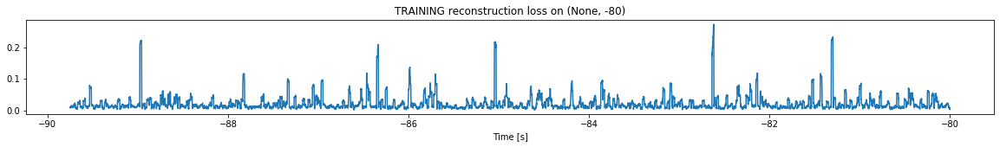

Finished training, median of the log(loss) is:  -1.848364925227313
<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


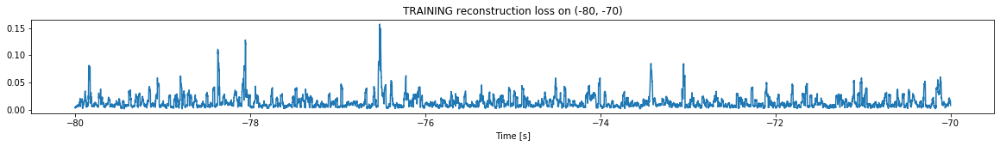

Finished training, median of the log(loss) is:  -2.0081269067772274
Triggering for section:  (-70, -60)
Using this median for triggering: -1.848364925227313


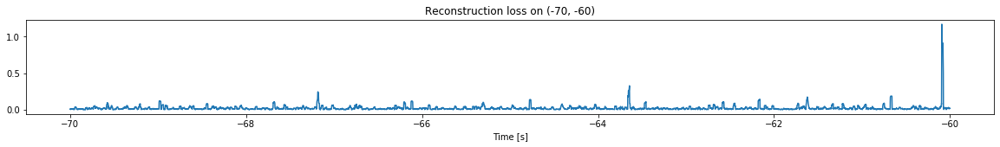

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


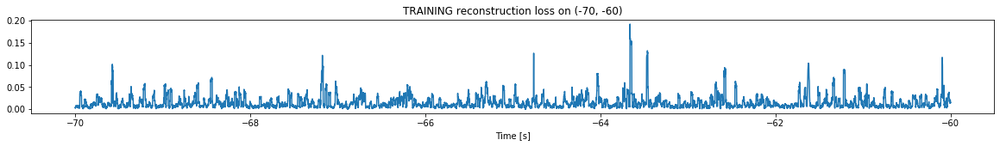

Finished training, median of the log(loss) is:  -1.9657253252750726
Triggering for section:  (-60, -50)
Using this median for triggering: -2.0081269067772274


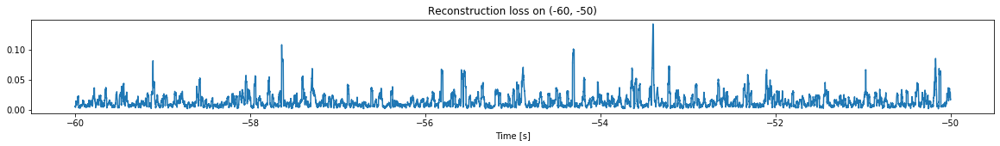

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


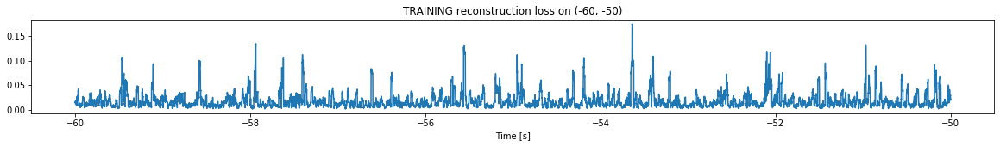

Finished training, median of the log(loss) is:  -1.8829404946248927
Triggering for section:  (-50, -40)
Using this median for triggering: -1.9657253252750726


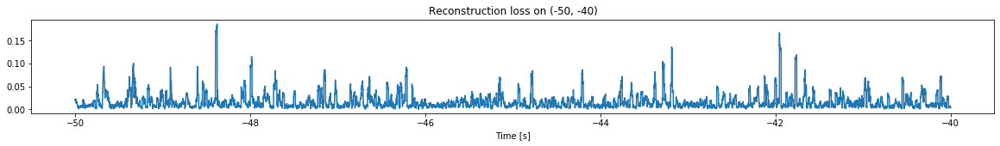

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


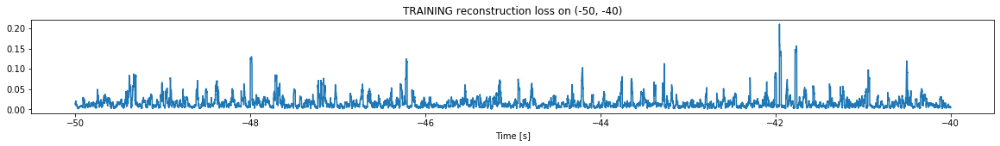

Finished training, median of the log(loss) is:  -1.9103196072682505
Triggering for section:  (-40, -30)
Using this median for triggering: -1.8829404946248927


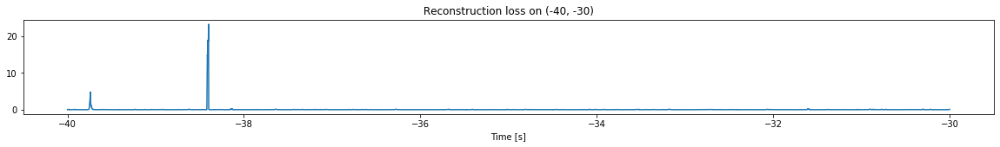

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


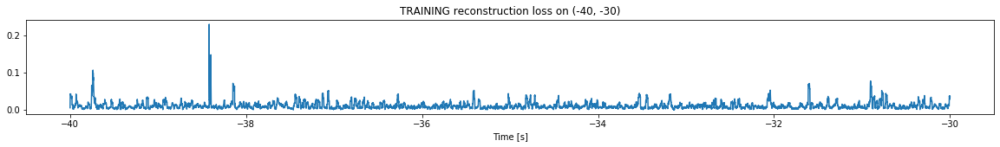

Finished training, median of the log(loss) is:  -2.034640495471086
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9103196072682505


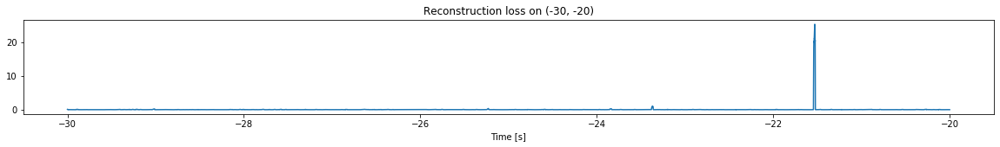

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


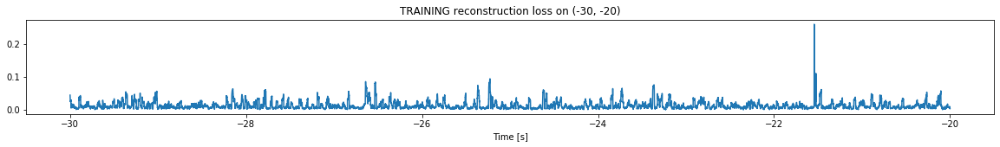

Finished training, median of the log(loss) is:  -1.987189425019065
Triggering for section:  (-20, -10)
Using this median for triggering: -2.034640495471086


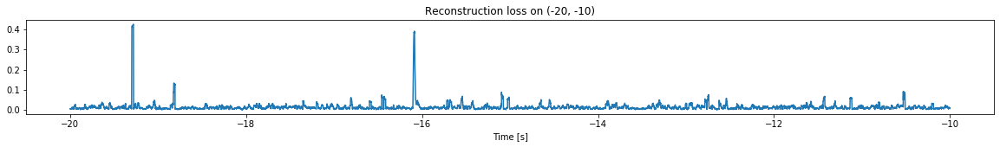

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


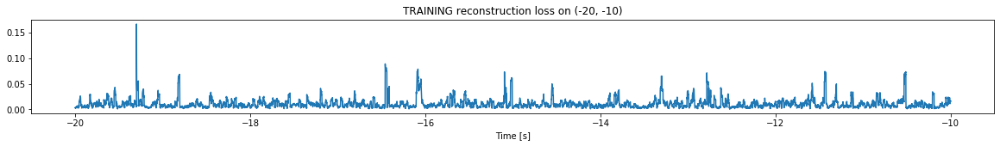

Finished training, median of the log(loss) is:  -2.0599972567657585
Triggering for section:  (-10, 0)
Using this median for triggering: -1.987189425019065


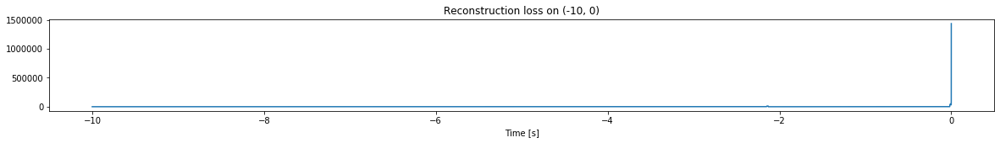

Other trigger time:  [-2.1325998 -0.006    ]
Their log loss values are:  [6.08183398 6.68723875]


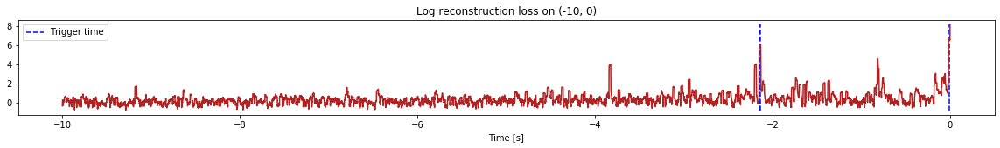

Triggered at:  [-2.1325998, -0.006]
<--------
Finished simulation, all the triggered times are:  [-2.1325998, -0.006]


In [17]:
simulation("./data/Ramp4/", 10, (-90,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (897500, 12)
Flushing input history
Number of sections: 9
Entering sections:  (-90, -80)
-------->
Entering sections:  (-80, -70)
-------->
Training for section:  (None, -80)


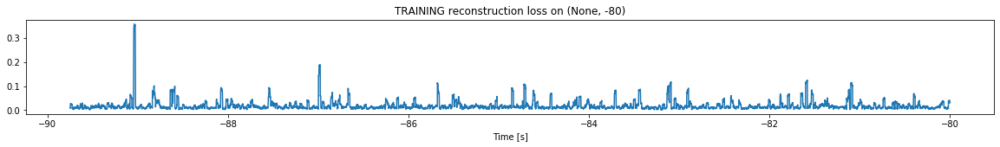

Finished training, median of the log(loss) is:  -1.8804076220347632
<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


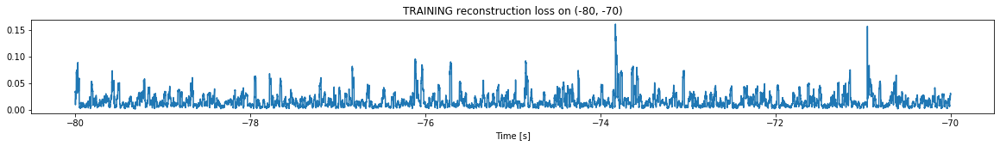

Finished training, median of the log(loss) is:  -1.9182765303382534
Triggering for section:  (-70, -60)
Using this median for triggering: -1.8804076220347632


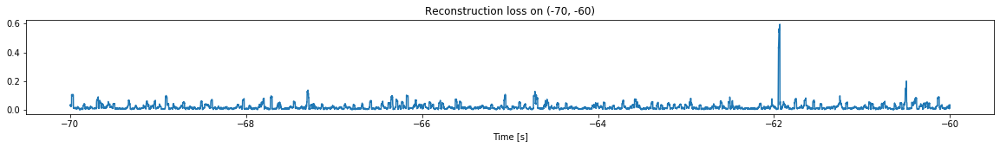

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


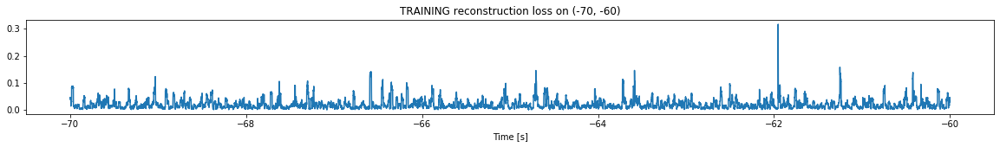

Finished training, median of the log(loss) is:  -1.7997988730920738
Triggering for section:  (-60, -50)
Using this median for triggering: -1.9182765303382534


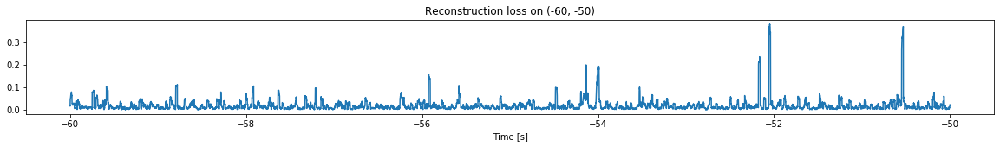

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


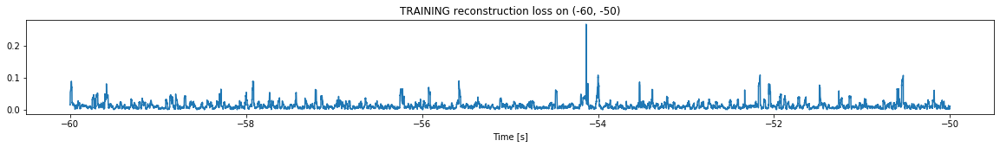

Finished training, median of the log(loss) is:  -1.9667755153163404
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7997988730920738


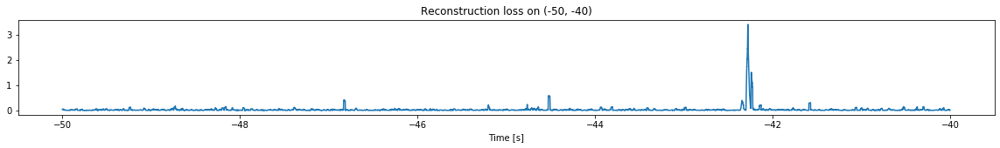

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


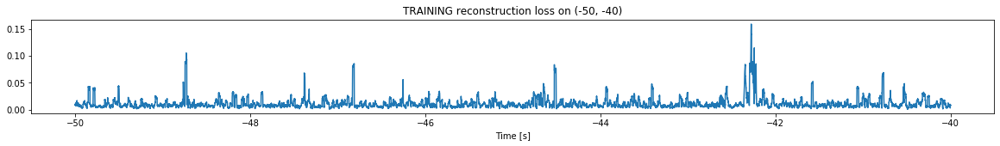

Finished training, median of the log(loss) is:  -2.065176708672278
Triggering for section:  (-40, -30)
Using this median for triggering: -1.9667755153163404


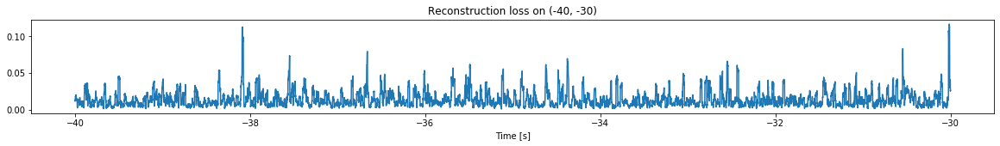

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


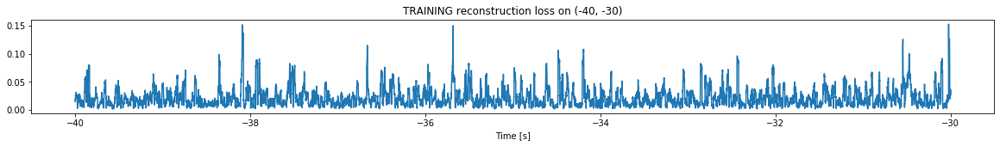

Finished training, median of the log(loss) is:  -1.7591115258478265
Triggering for section:  (-30, -20)
Using this median for triggering: -2.065176708672278


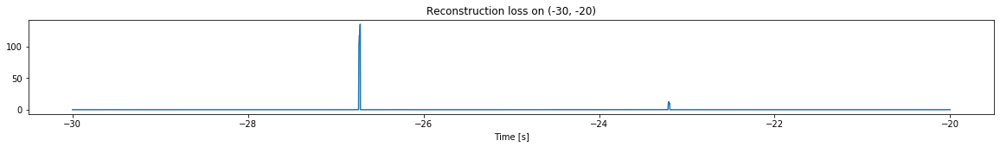

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


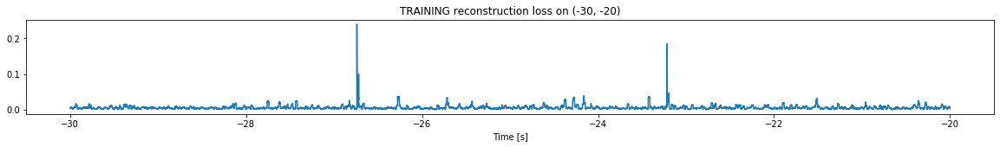

Finished training, median of the log(loss) is:  -2.2672952103949062
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7591115258478265


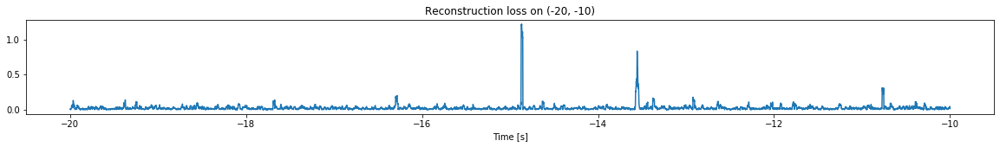

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


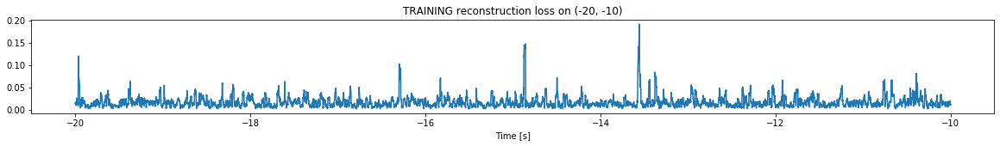

Finished training, median of the log(loss) is:  -1.8663605764331788
Triggering for section:  (-10, 0)
Using this median for triggering: -2.2672952103949062


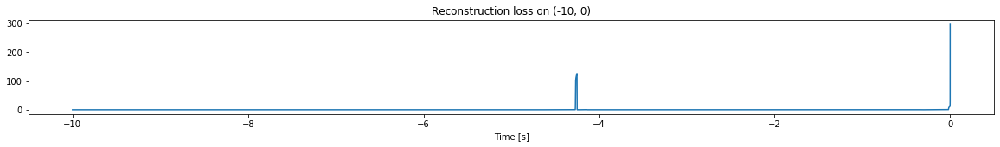

<--------
Finished simulation, all the triggered times are:  []


In [18]:
simulation("./data/Ramp5/", 10, (-90,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


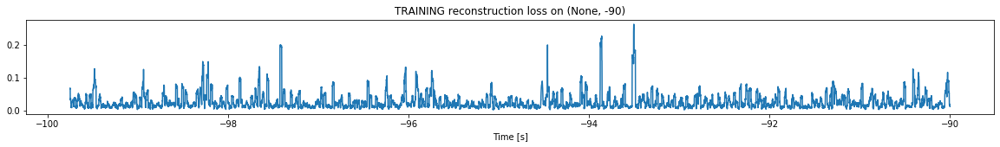

Finished training, median of the log(loss) is:  -1.714121265211901
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


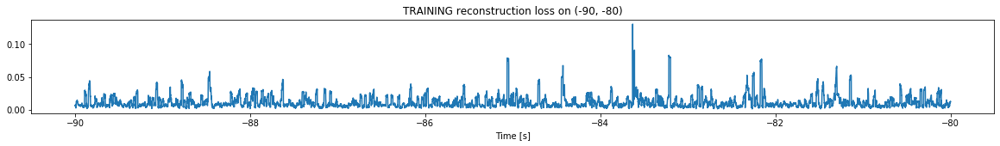

Finished training, median of the log(loss) is:  -2.0744999880852895
Triggering for section:  (-80, -70)
Using this median for triggering: -1.714121265211901


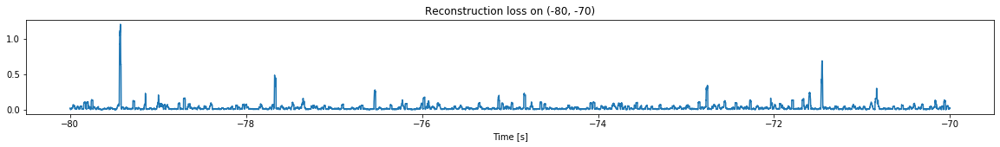

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


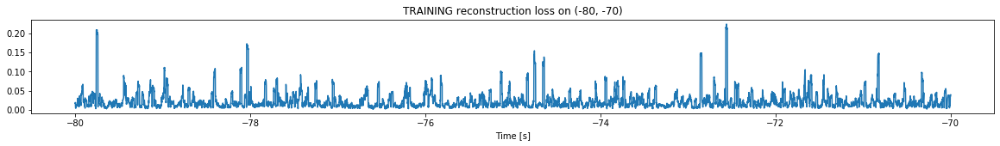

Finished training, median of the log(loss) is:  -1.8018325376527193
Triggering for section:  (-70, -60)
Using this median for triggering: -2.0744999880852895


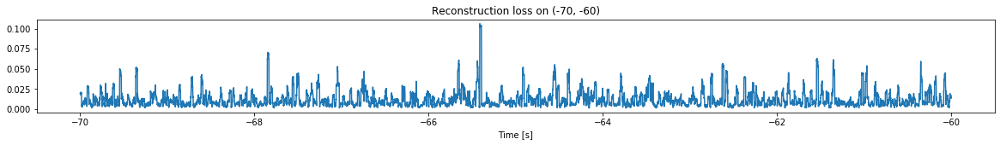

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


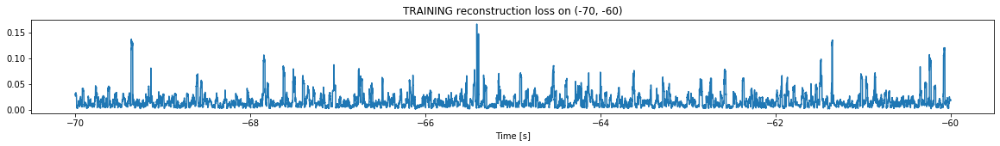

Finished training, median of the log(loss) is:  -1.8963874466198958
Triggering for section:  (-60, -50)
Using this median for triggering: -1.8018325376527193


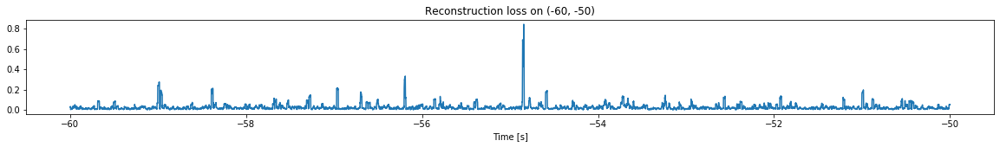

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


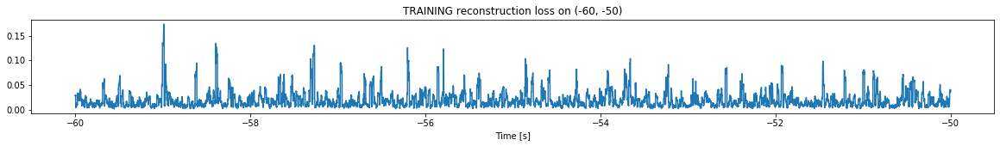

Finished training, median of the log(loss) is:  -1.8350772793648062
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8963874466198958


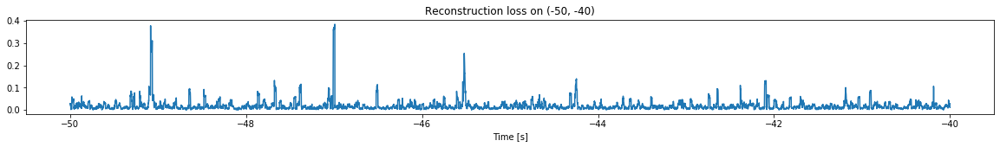

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


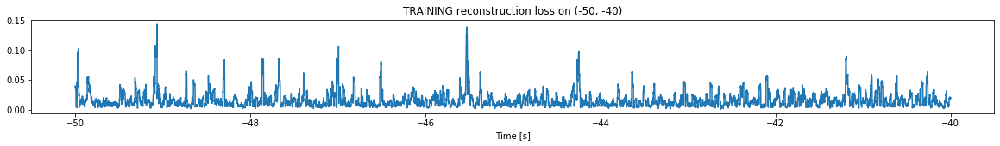

Finished training, median of the log(loss) is:  -1.9055384857920203
Triggering for section:  (-40, -30)
Using this median for triggering: -1.8350772793648062


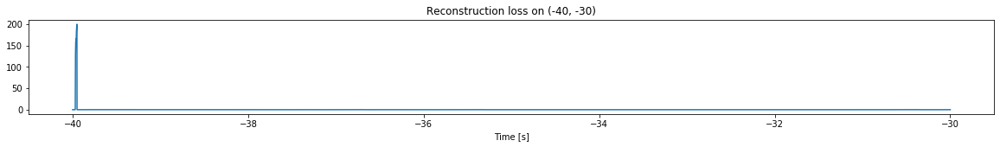

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


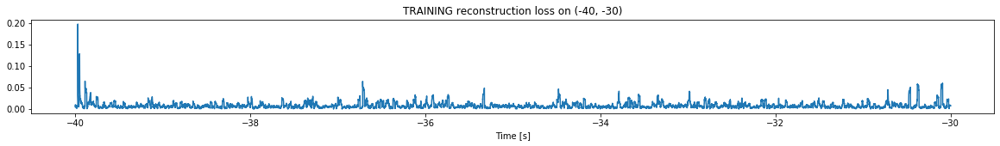

Finished training, median of the log(loss) is:  -2.1482570771641045
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9055384857920203


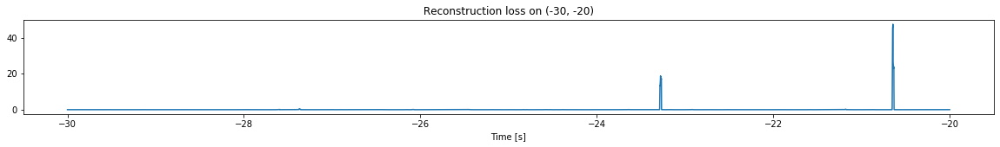

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


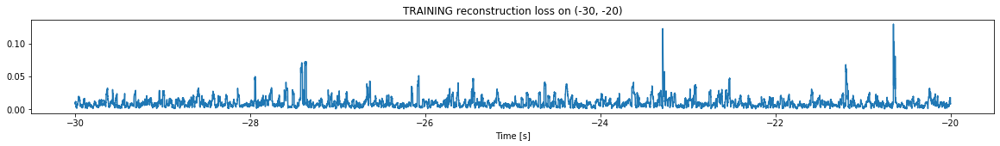

Finished training, median of the log(loss) is:  -2.0901144121245805
Triggering for section:  (-20, -10)
Using this median for triggering: -2.1482570771641045


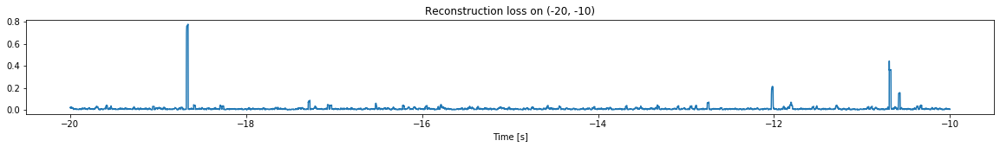

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


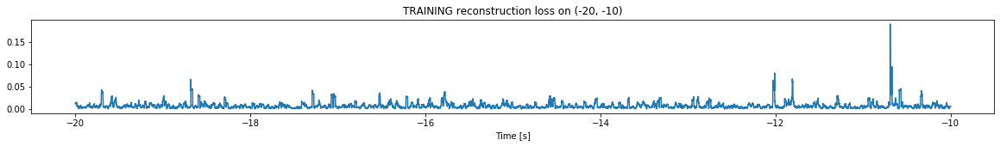

Finished training, median of the log(loss) is:  -2.2019191080215483
Triggering for section:  (-10, 0)
Using this median for triggering: -2.0901144121245805


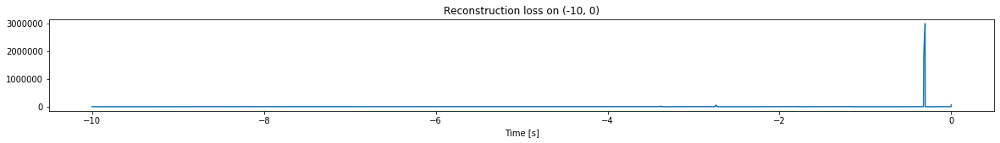

Other trigger time:  [-4.4707    -3.3792999 -2.731     -1.7816999 -1.1642    -0.3037   ]
Their log loss values are:  [5.37388925 6.50273286 6.81149954 5.88163776 5.81631841 8.56814918]


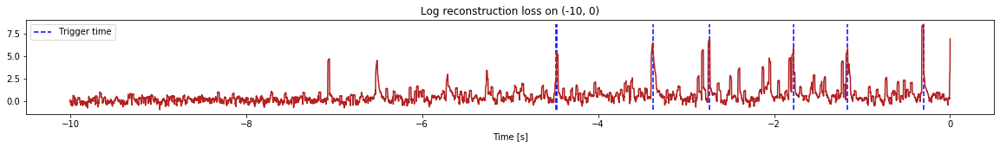

Triggered at:  [-4.4707, -3.3792999, -2.731, -1.7816999, -1.1642, -0.3037]
<--------
Finished simulation, all the triggered times are:  [-4.4707, -3.3792999, -2.731, -1.7816999, -1.1642, -0.3037]


In [16]:
simulation("./data/Ramp12d/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 30
Entering sections:  (-300, -290)
-------->
Entering sections:  (-290, -280)
-------->
Training for section:  (None, -290)


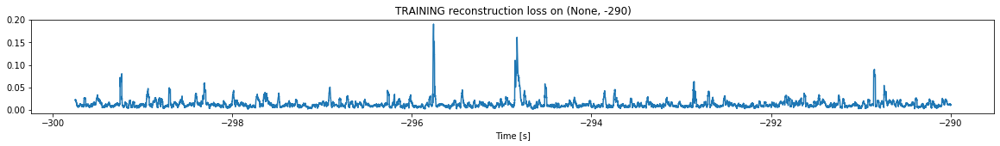

Finished training, median of the log(loss) is:  -1.9753903147592076
<--------
Entering sections:  (-280, -270)
-------->
Training for section:  (-290, -280)


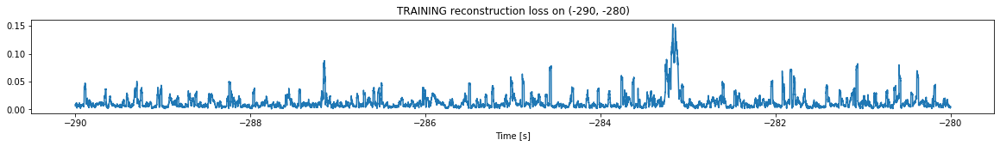

Finished training, median of the log(loss) is:  -2.03996623142178
Triggering for section:  (-280, -270)
Using this median for triggering: -1.9753903147592076


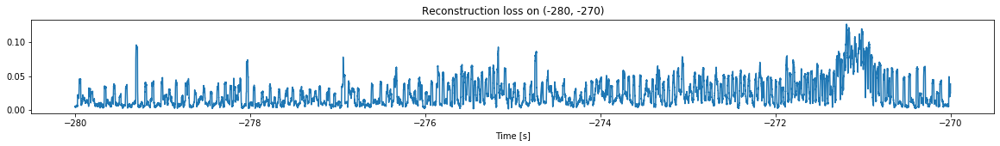

<--------
Entering sections:  (-270, -260)
-------->
Training for section:  (-280, -270)


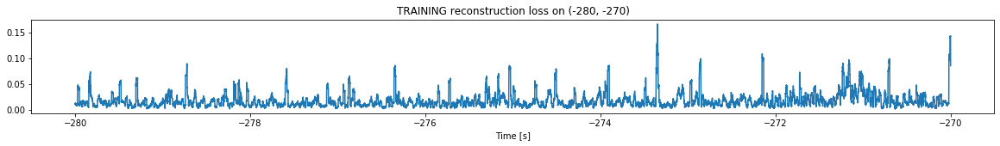

Finished training, median of the log(loss) is:  -1.8661391859505527
Triggering for section:  (-270, -260)
Using this median for triggering: -2.03996623142178


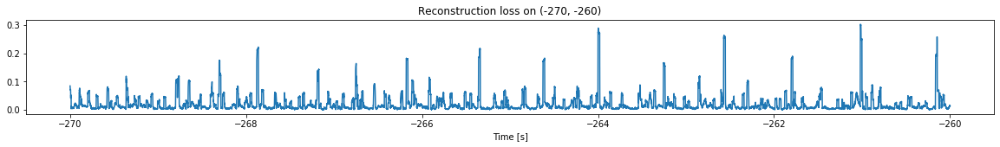

<--------
Entering sections:  (-260, -250)
-------->
Training for section:  (-270, -260)


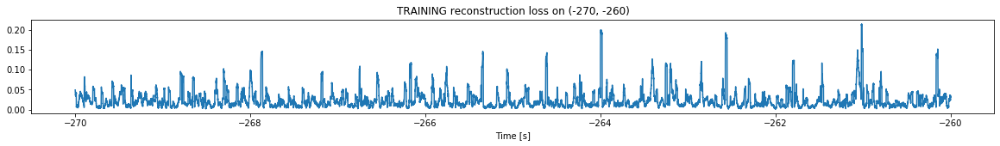

Finished training, median of the log(loss) is:  -1.7598102801087463
Triggering for section:  (-260, -250)
Using this median for triggering: -1.8661391859505527


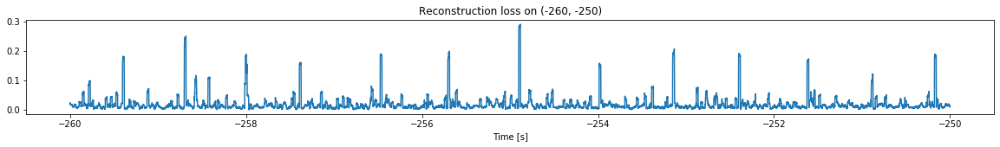

<--------
Entering sections:  (-250, -240)
-------->
Training for section:  (-260, -250)


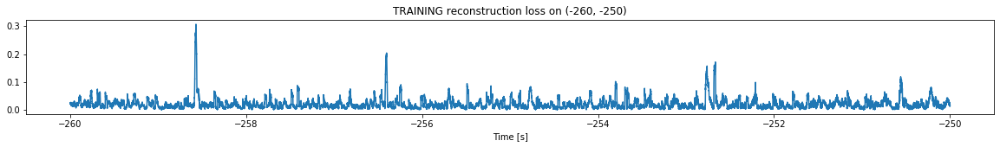

Finished training, median of the log(loss) is:  -1.7832326077689284
Triggering for section:  (-250, -240)
Using this median for triggering: -1.7598102801087463


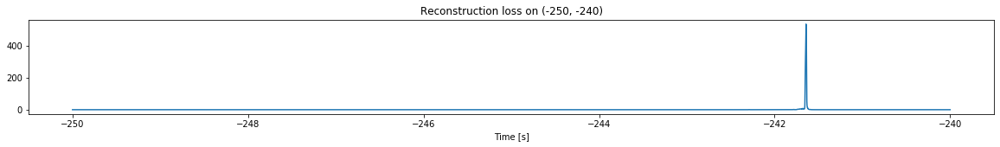

<--------
Entering sections:  (-240, -230)
-------->
Training for section:  (-250, -240)


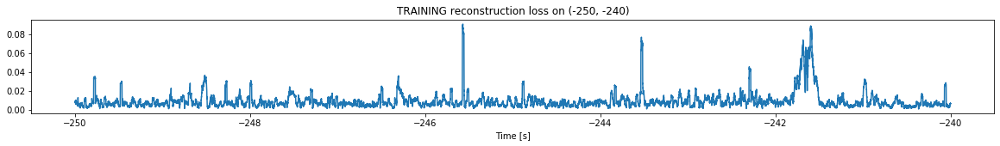

Finished training, median of the log(loss) is:  -2.1469645152977788
Triggering for section:  (-240, -230)
Using this median for triggering: -1.7832326077689284


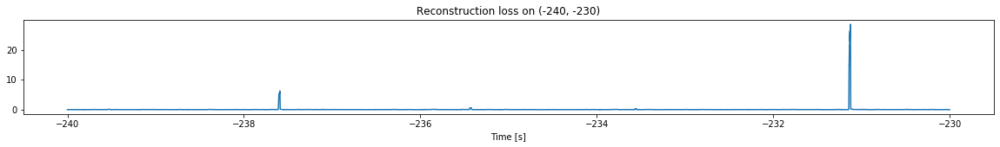

<--------
Entering sections:  (-230, -220)
-------->
Training for section:  (-240, -230)


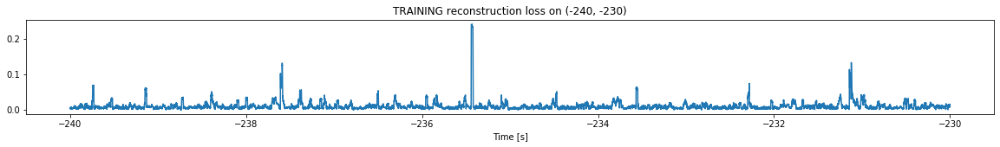

Finished training, median of the log(loss) is:  -2.107503216288413
Triggering for section:  (-230, -220)
Using this median for triggering: -2.1469645152977788


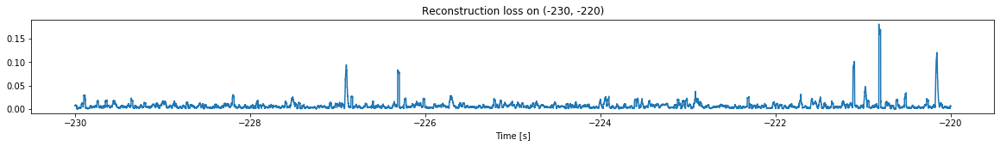

<--------
Entering sections:  (-220, -210)
-------->
Training for section:  (-230, -220)


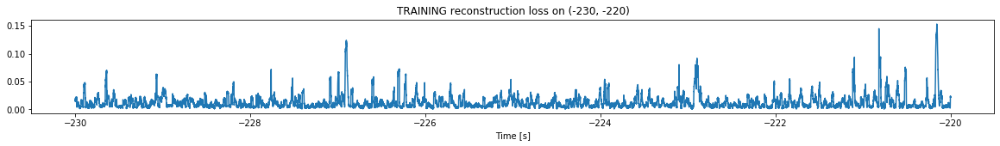

Finished training, median of the log(loss) is:  -2.040534561532831
Triggering for section:  (-220, -210)
Using this median for triggering: -2.107503216288413


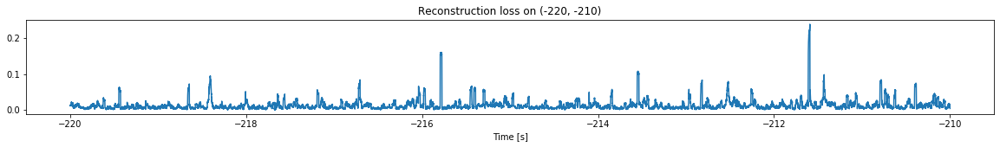

<--------
Entering sections:  (-210, -200)
-------->
Training for section:  (-220, -210)


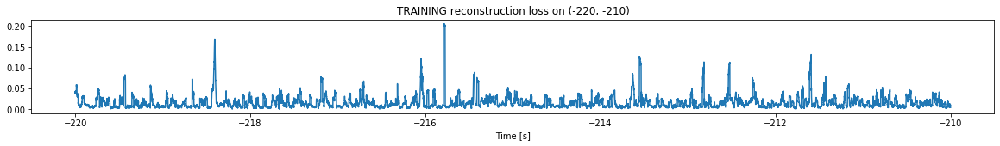

Finished training, median of the log(loss) is:  -1.908596600275969
Triggering for section:  (-210, -200)
Using this median for triggering: -2.040534561532831


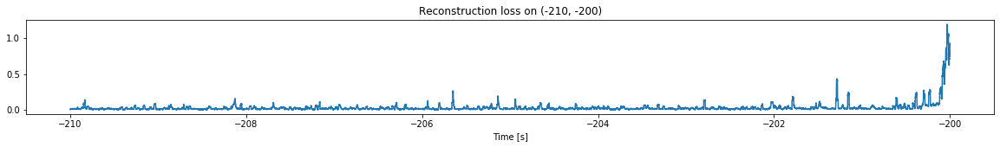

<--------
Entering sections:  (-200, -190)
-------->
Training for section:  (-210, -200)


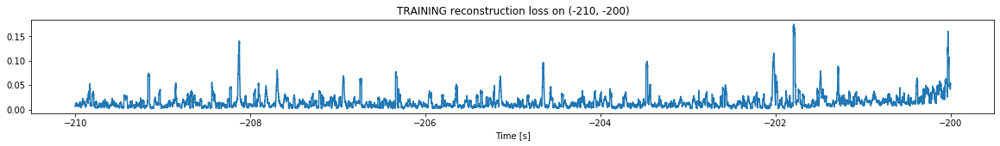

Finished training, median of the log(loss) is:  -1.9193590164485892
Triggering for section:  (-200, -190)
Using this median for triggering: -1.908596600275969


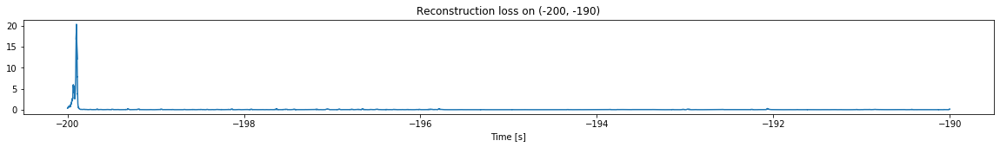

<--------
Entering sections:  (-190, -180)
-------->
Training for section:  (-200, -190)


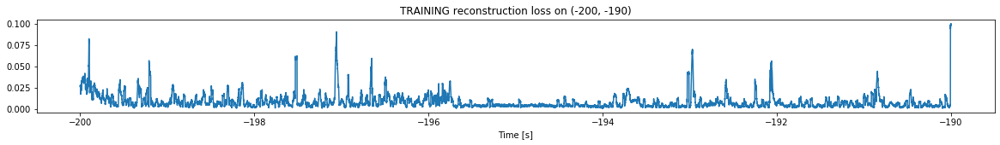

Finished training, median of the log(loss) is:  -2.2399784546252635
Triggering for section:  (-190, -180)
Using this median for triggering: -1.9193590164485892


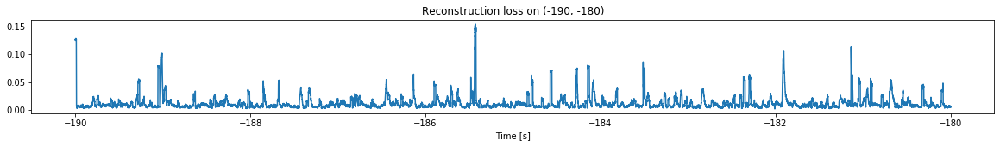

<--------
Entering sections:  (-180, -170)
-------->
Training for section:  (-190, -180)


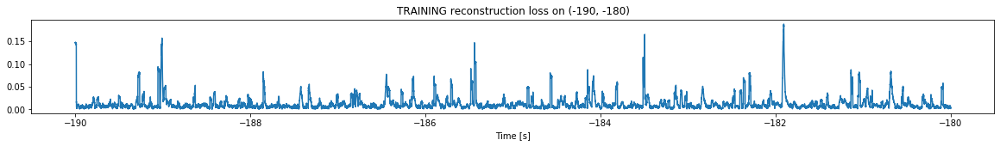

Finished training, median of the log(loss) is:  -2.0870510202805246
Triggering for section:  (-180, -170)
Using this median for triggering: -2.2399784546252635


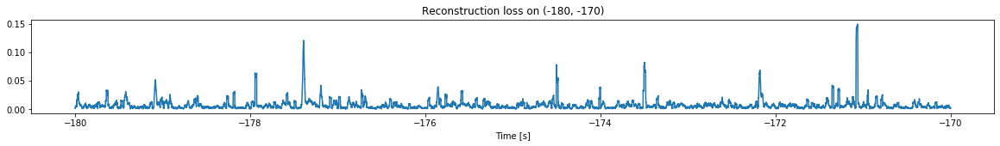

<--------
Entering sections:  (-170, -160)
-------->
Training for section:  (-180, -170)


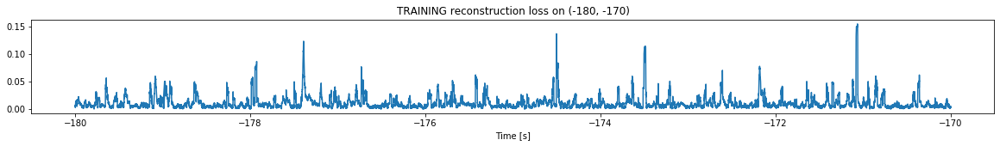

Finished training, median of the log(loss) is:  -2.0958829064551
Triggering for section:  (-170, -160)
Using this median for triggering: -2.0870510202805246


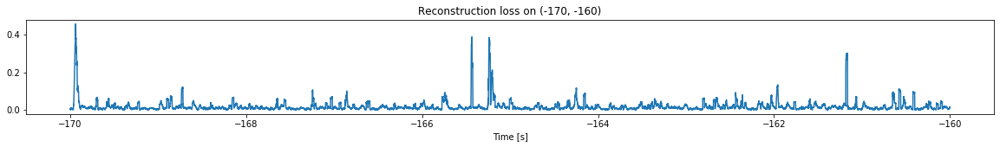

<--------
Entering sections:  (-160, -150)
-------->
Training for section:  (-170, -160)


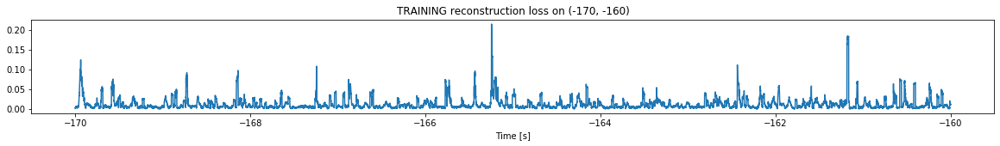

Finished training, median of the log(loss) is:  -2.1004474008052996
Triggering for section:  (-160, -150)
Using this median for triggering: -2.0958829064551


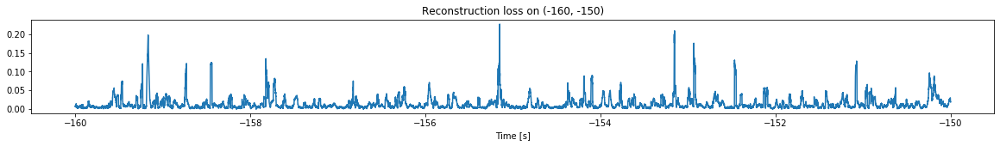

<--------
Entering sections:  (-150, -140)
-------->
Training for section:  (-160, -150)


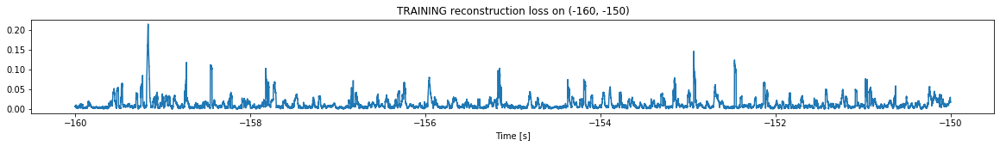

Finished training, median of the log(loss) is:  -2.0744537882960747
Triggering for section:  (-150, -140)
Using this median for triggering: -2.1004474008052996


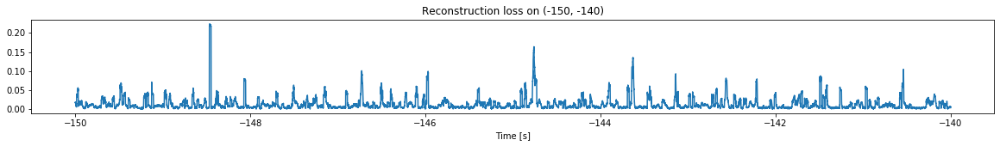

<--------
Entering sections:  (-140, -130)
-------->
Training for section:  (-150, -140)


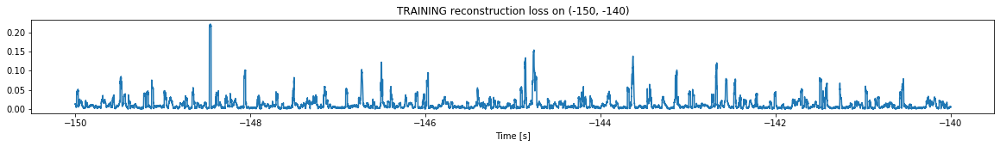

Finished training, median of the log(loss) is:  -2.1122791532572487
Triggering for section:  (-140, -130)
Using this median for triggering: -2.0744537882960747


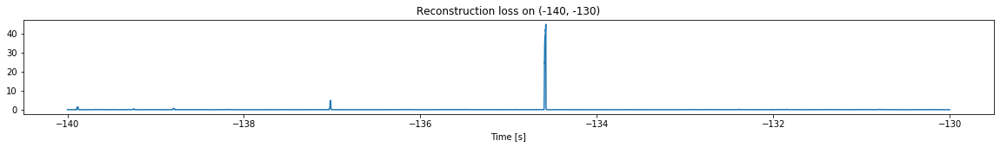

<--------
Entering sections:  (-130, -120)
-------->
Training for section:  (-140, -130)


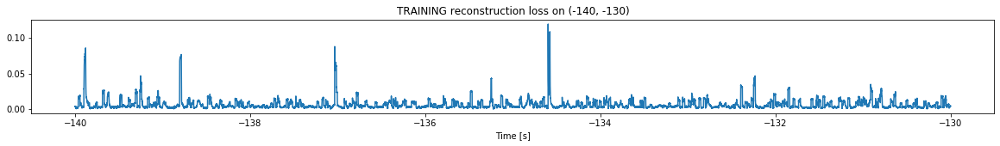

Finished training, median of the log(loss) is:  -2.3556625999515175
Triggering for section:  (-130, -120)
Using this median for triggering: -2.1122791532572487


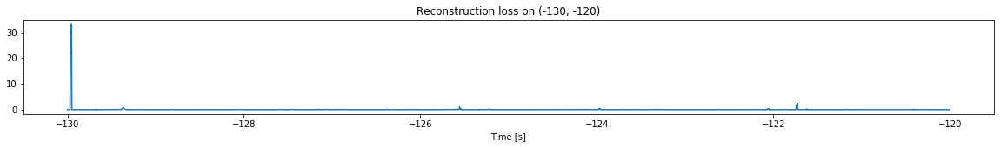

<--------
Entering sections:  (-120, -110)
-------->
Training for section:  (-130, -120)


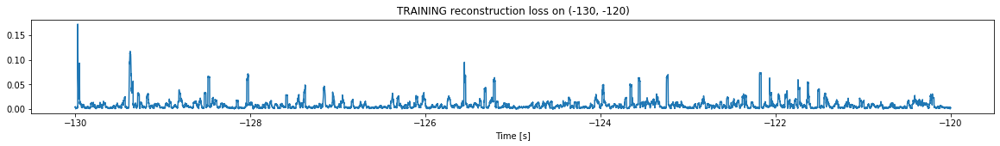

Finished training, median of the log(loss) is:  -2.2076259225955965
Triggering for section:  (-120, -110)
Using this median for triggering: -2.3556625999515175


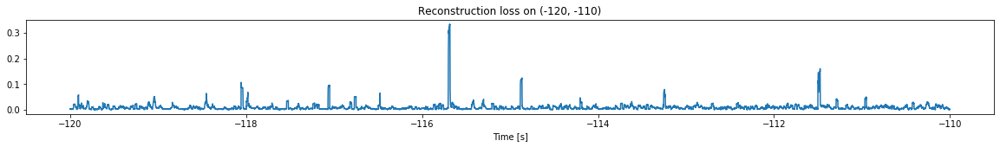

<--------
Entering sections:  (-110, -100)
-------->
Training for section:  (-120, -110)


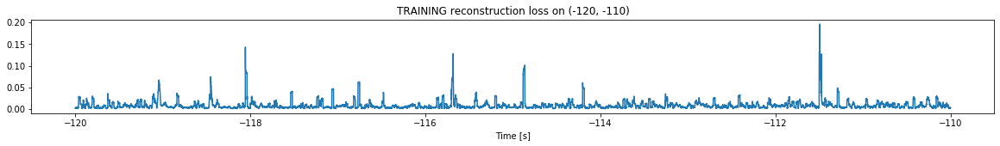

Finished training, median of the log(loss) is:  -2.1878209768551433
Triggering for section:  (-110, -100)
Using this median for triggering: -2.2076259225955965


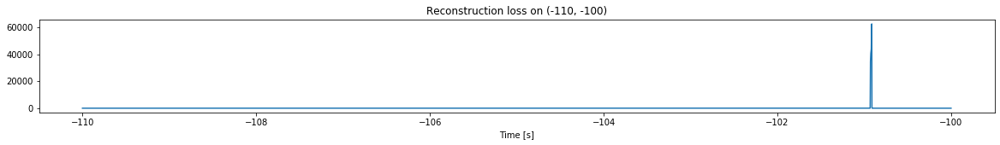

Other trigger time:  [-100.91249]
Their log loss values are:  [7.00454173]


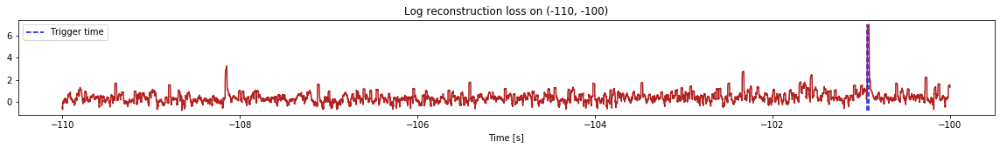

Triggered at:  [-100.91249]
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


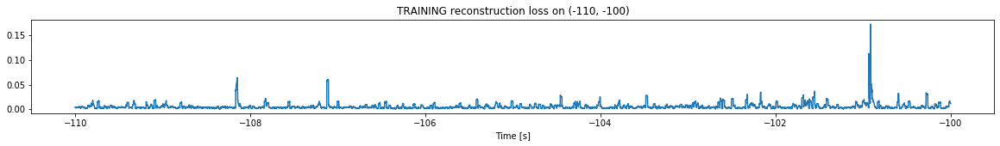

Finished training, median of the log(loss) is:  -2.415338359316393
Triggering for section:  (-100, -90)
Using this median for triggering: -2.1878209768551433


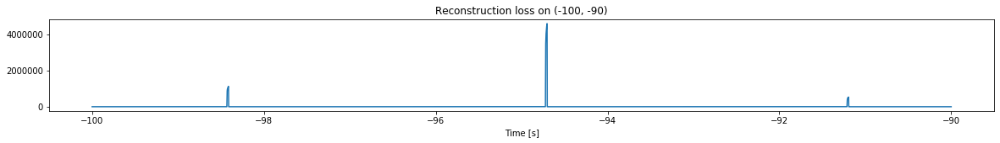

Other trigger time:  [-99.53959  -98.41249  -95.22369  -94.704185 -91.80379  -91.193886]
Their log loss values are:  [5.83162906 8.23818948 5.85126424 8.84931954 5.67928848 7.91480424]


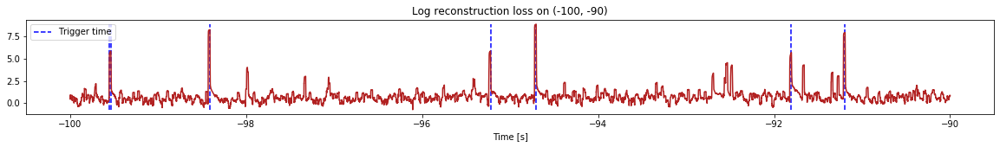

Triggered at:  [-99.53959, -98.41249, -95.22369, -94.704185, -91.80379, -91.193886]
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


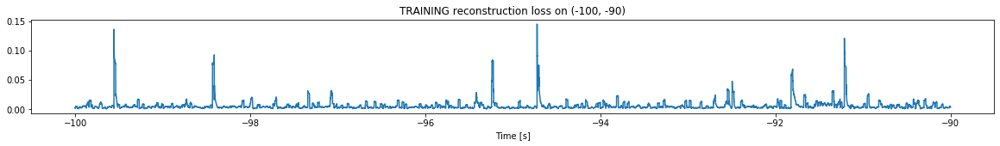

Finished training, median of the log(loss) is:  -2.364427967456085
Triggering for section:  (-90, -80)
Using this median for triggering: -2.415338359316393


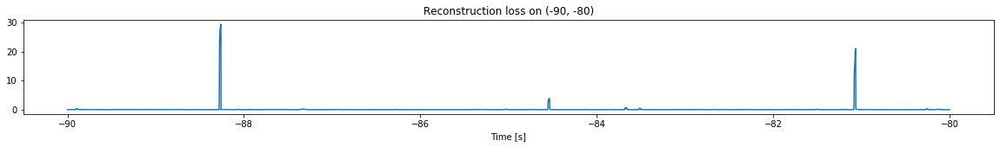

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


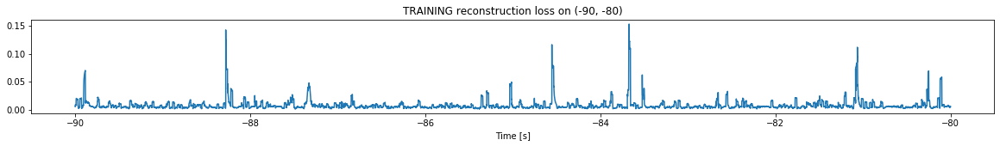

Finished training, median of the log(loss) is:  -2.273881040905568
Triggering for section:  (-80, -70)
Using this median for triggering: -2.364427967456085


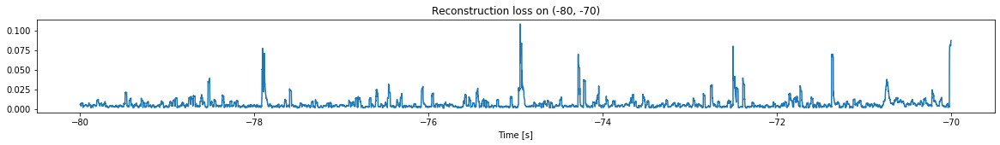

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


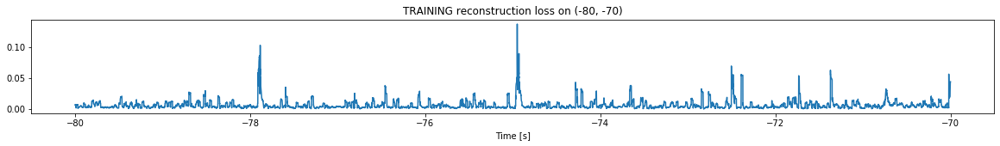

Finished training, median of the log(loss) is:  -2.3260348309821715
Triggering for section:  (-70, -60)
Using this median for triggering: -2.273881040905568


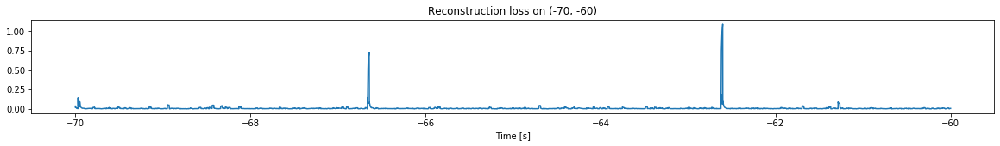

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


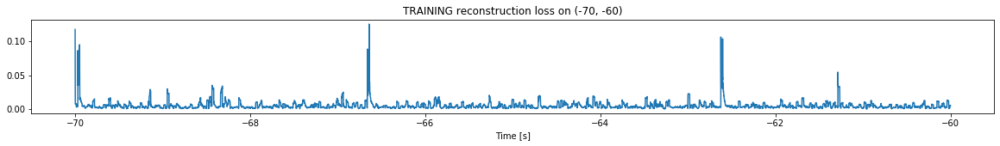

Finished training, median of the log(loss) is:  -2.3980027447145797
Triggering for section:  (-60, -50)
Using this median for triggering: -2.3260348309821715


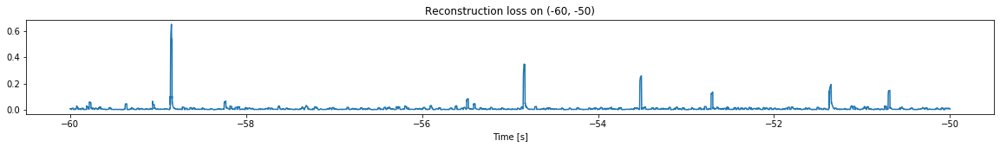

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


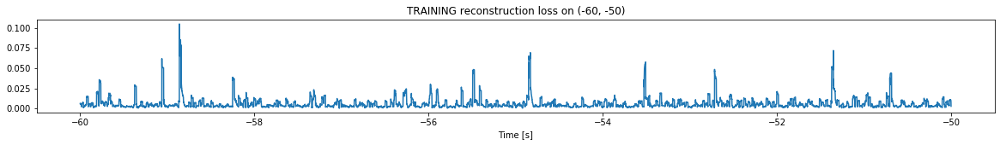

Finished training, median of the log(loss) is:  -2.384249628660552
Triggering for section:  (-50, -40)
Using this median for triggering: -2.3980027447145797


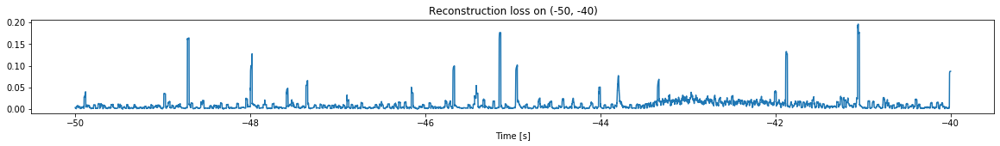

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


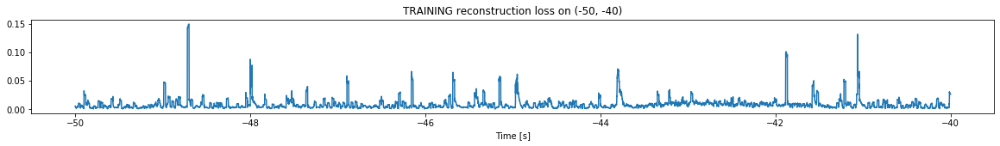

Finished training, median of the log(loss) is:  -2.1461405185731657
Triggering for section:  (-40, -30)
Using this median for triggering: -2.384249628660552


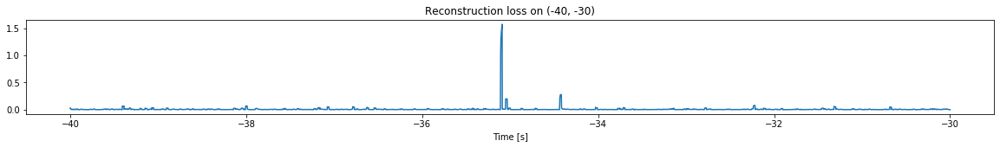

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


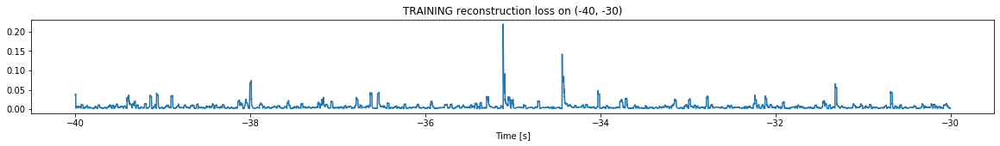

Finished training, median of the log(loss) is:  -2.318603083714187
Triggering for section:  (-30, -20)
Using this median for triggering: -2.1461405185731657


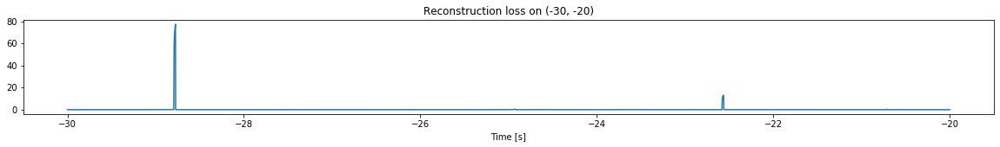

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


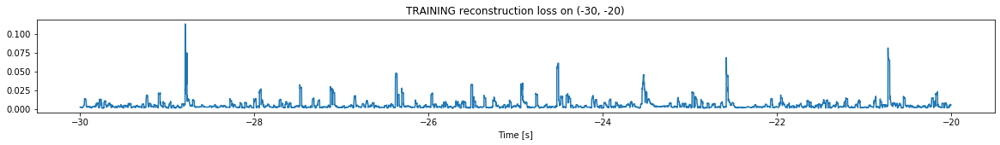

Finished training, median of the log(loss) is:  -2.490536141449534
Triggering for section:  (-20, -10)
Using this median for triggering: -2.318603083714187


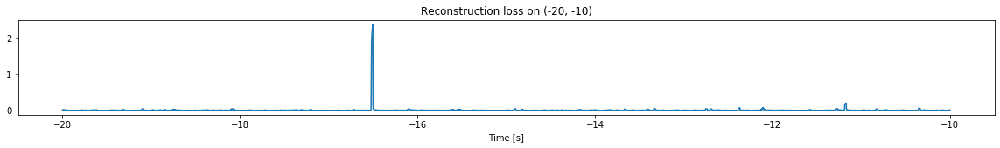

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


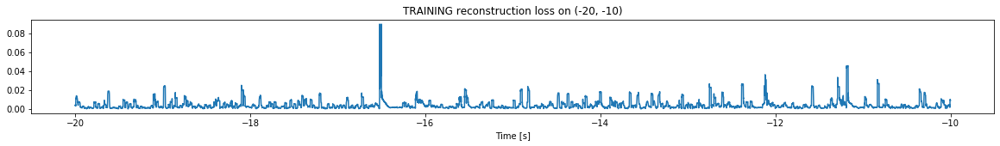

Finished training, median of the log(loss) is:  -2.5221499684106394
Triggering for section:  (-10, 0)
Using this median for triggering: -2.490536141449534


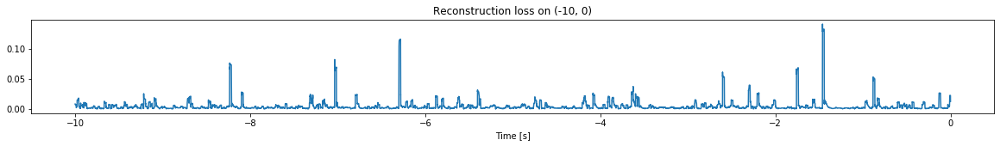

<--------
Finished simulation, all the triggered times are:  [-100.91249, -99.53959, -98.41249, -95.22369, -94.704185, -91.80379, -91.193886]


In [19]:
simulation("./data/Ramp19/", 10, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2117500, 12)
Flushing input history
Number of sections: 21
Entering sections:  (-210, -200)
-------->
Entering sections:  (-200, -190)
-------->
Training for section:  (None, -200)


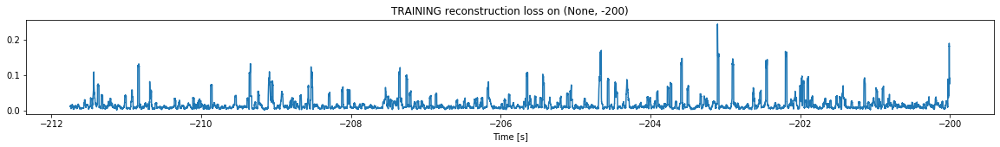

Finished training, median of the log(loss) is:  -1.9403251413668654
<--------
Entering sections:  (-190, -180)
-------->
Training for section:  (-200, -190)


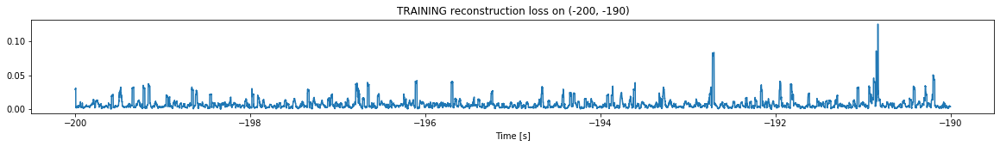

Finished training, median of the log(loss) is:  -2.2550941018400232
Triggering for section:  (-190, -180)
Using this median for triggering: -1.9403251413668654


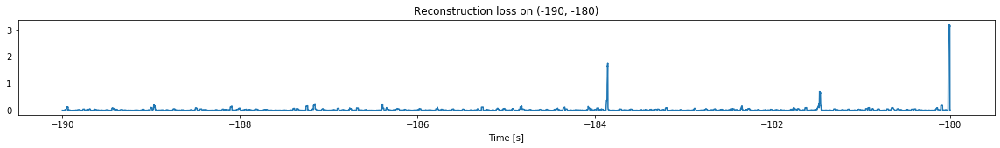

<--------
Entering sections:  (-180, -170)
-------->
Training for section:  (-190, -180)


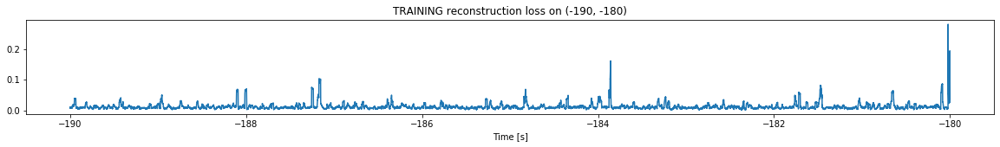

Finished training, median of the log(loss) is:  -2.0182880172226483
Triggering for section:  (-180, -170)
Using this median for triggering: -2.2550941018400232


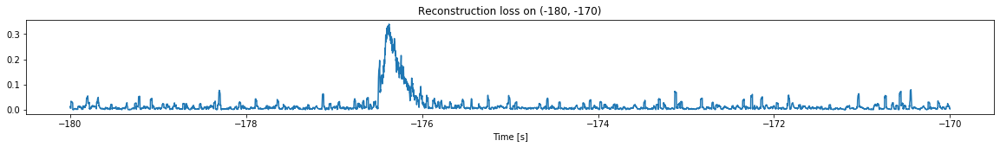

<--------
Entering sections:  (-170, -160)
-------->
Training for section:  (-180, -170)


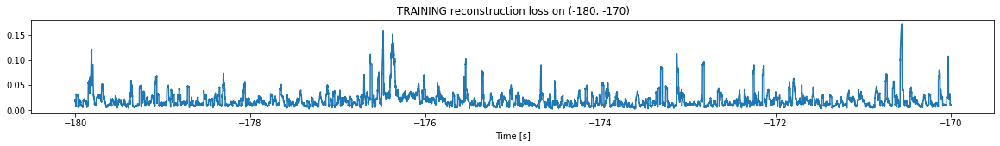

Finished training, median of the log(loss) is:  -1.7941153181686182
Triggering for section:  (-170, -160)
Using this median for triggering: -2.0182880172226483


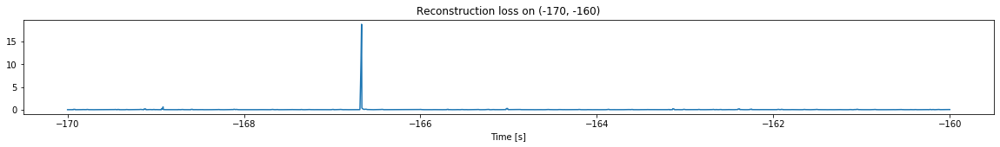

<--------
Entering sections:  (-160, -150)
-------->
Training for section:  (-170, -160)


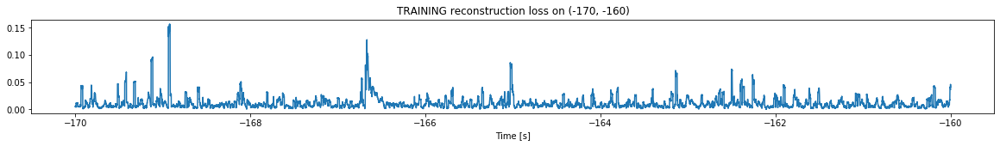

Finished training, median of the log(loss) is:  -2.0631867363886407
Triggering for section:  (-160, -150)
Using this median for triggering: -1.7941153181686182


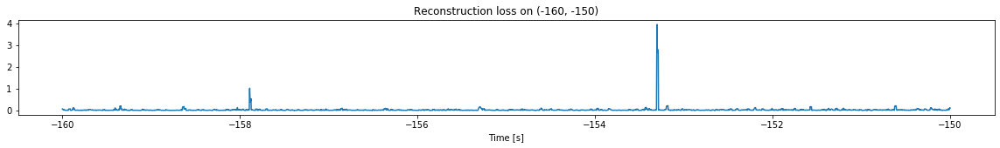

<--------
Entering sections:  (-150, -140)
-------->
Training for section:  (-160, -150)


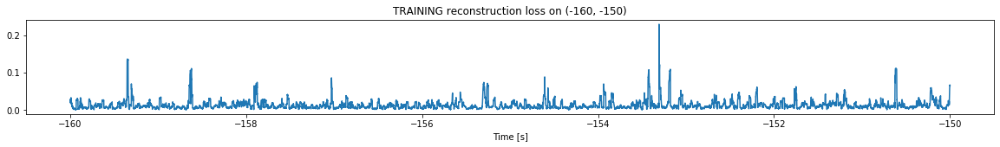

Finished training, median of the log(loss) is:  -1.9866784158294575
Triggering for section:  (-150, -140)
Using this median for triggering: -2.0631867363886407


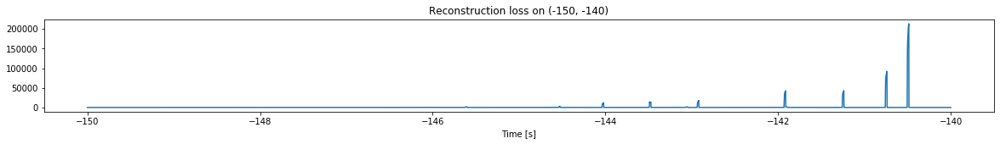

Other trigger time:  [-145.60439 -144.52678 -144.02179 -143.48839 -142.9188  -141.91309
 -141.23909 -140.48679]
Their log loss values are:  [5.26476606 5.5214477  6.14667642 6.22143263 6.31402277 6.69092607
 6.69488326 7.39264778]


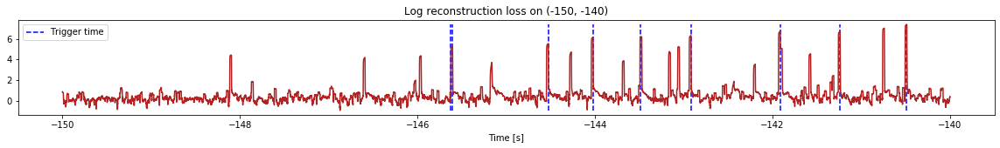

Triggered at:  [-145.60439, -144.52678, -144.02179, -143.48839, -142.9188, -141.91309, -141.23909, -140.48679]
<--------
Entering sections:  (-140, -130)
-------->
Training for section:  (-150, -140)


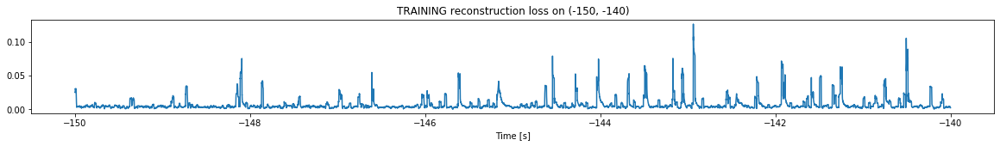

Finished training, median of the log(loss) is:  -2.3477219487128327
Triggering for section:  (-140, -130)
Using this median for triggering: -1.9866784158294575


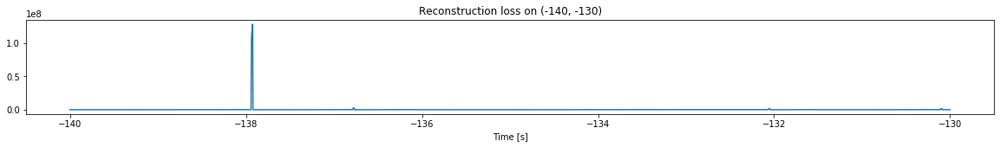

Other trigger time:  [-139.85579 -139.14519 -137.92479 -136.77028 -136.0718  -134.94579
 -133.17009 -132.0474  -131.52489 -130.09099]
Their log loss values are:  [ 5.46353319  5.44399937 10.09646424  8.40632884  7.32471075  7.09933192
  6.9930985   8.24110827  7.52865275  8.2278227 ]


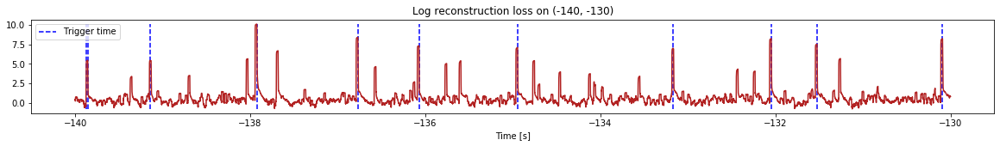

Triggered at:  [-139.85579, -139.14519, -137.92479, -136.77028, -136.0718, -134.94579, -133.17009, -132.0474, -131.52489, -130.09099]
<--------
Entering sections:  (-130, -120)
-------->
Training for section:  (-140, -130)


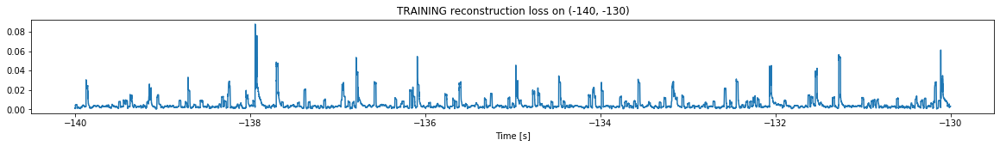

Finished training, median of the log(loss) is:  -2.473080656563843
Triggering for section:  (-130, -120)
Using this median for triggering: -2.3477219487128327


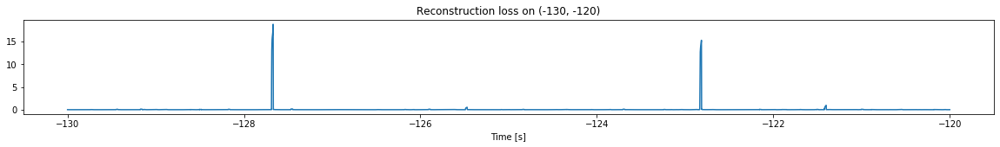

<--------
Entering sections:  (-120, -110)
-------->
Training for section:  (-130, -120)


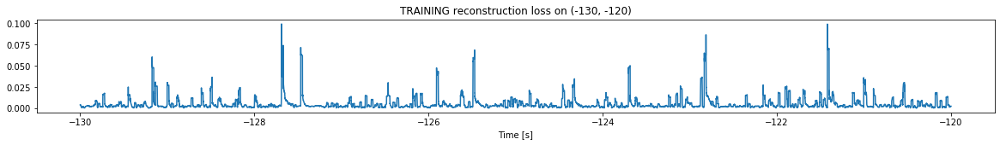

Finished training, median of the log(loss) is:  -2.490014034902515
Triggering for section:  (-120, -110)
Using this median for triggering: -2.473080656563843


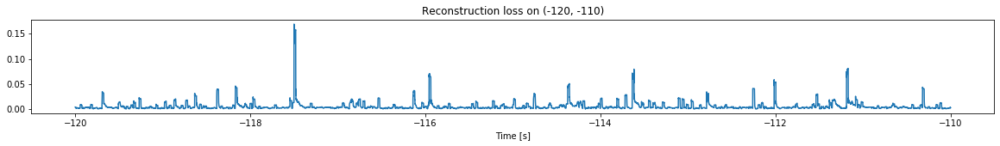

<--------
Entering sections:  (-110, -100)
-------->
Training for section:  (-120, -110)


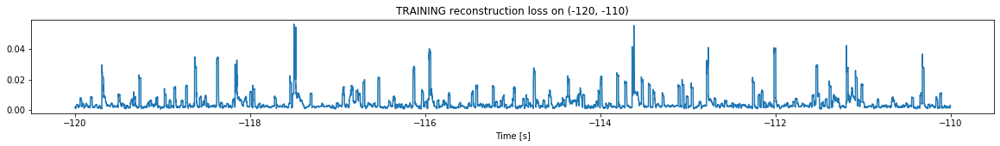

Finished training, median of the log(loss) is:  -2.5423556156448033
Triggering for section:  (-110, -100)
Using this median for triggering: -2.490014034902515


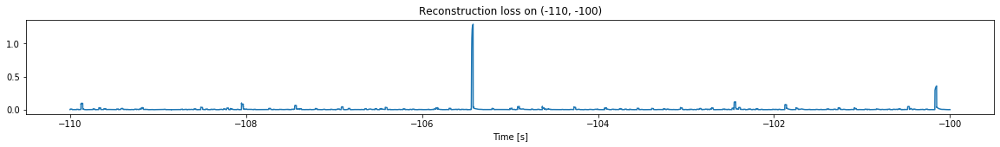

<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


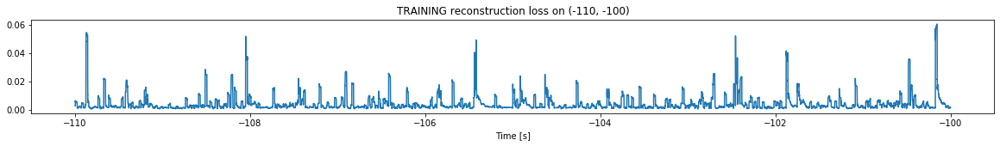

Finished training, median of the log(loss) is:  -2.6156953502910048
Triggering for section:  (-100, -90)
Using this median for triggering: -2.5423556156448033


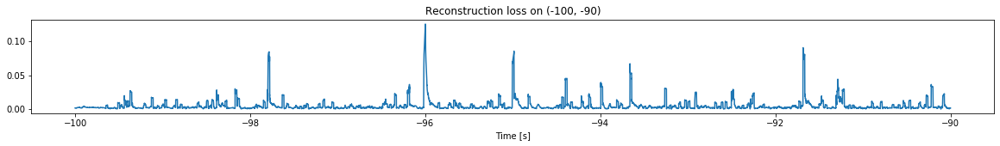

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


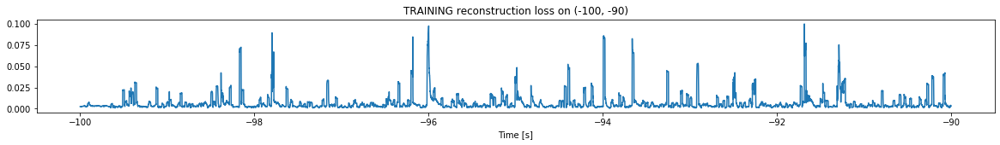

Finished training, median of the log(loss) is:  -2.421681817643848
Triggering for section:  (-90, -80)
Using this median for triggering: -2.6156953502910048


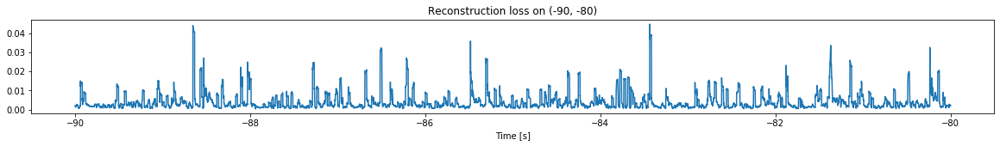

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


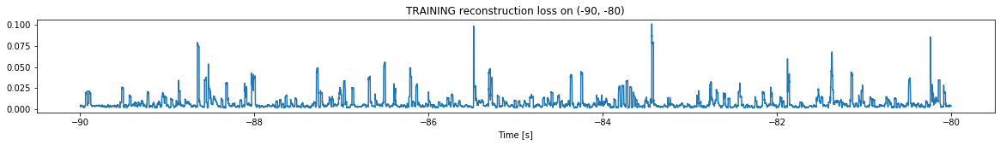

Finished training, median of the log(loss) is:  -2.3501297526432334
Triggering for section:  (-80, -70)
Using this median for triggering: -2.421681817643848


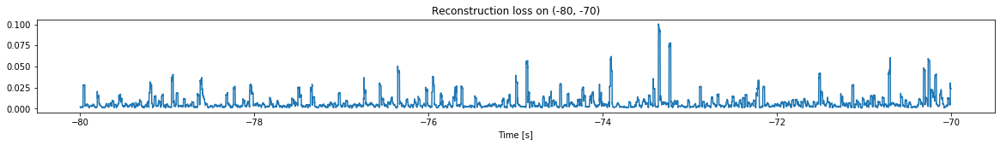

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


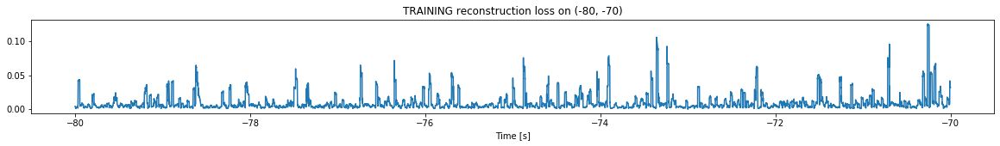

Finished training, median of the log(loss) is:  -2.230664521580148
Triggering for section:  (-70, -60)
Using this median for triggering: -2.3501297526432334


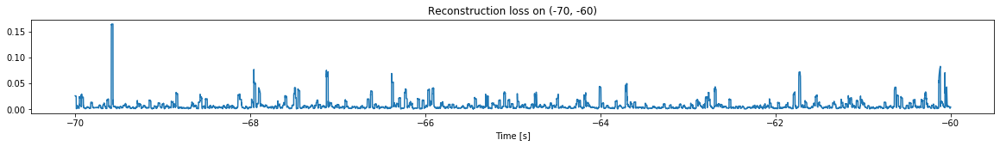

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


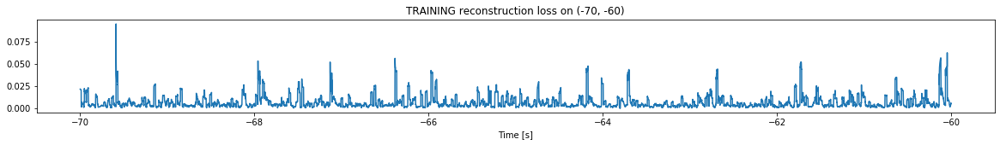

Finished training, median of the log(loss) is:  -2.331693425586588
Triggering for section:  (-60, -50)
Using this median for triggering: -2.230664521580148


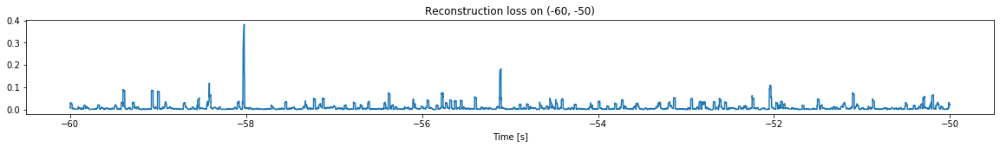

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


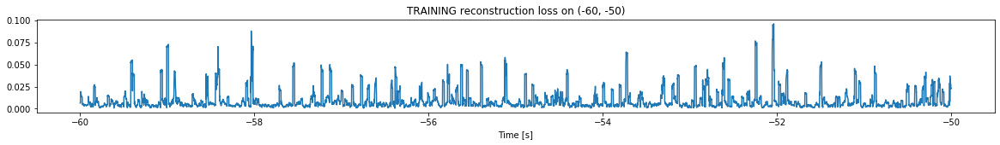

Finished training, median of the log(loss) is:  -2.255765644171378
Triggering for section:  (-50, -40)
Using this median for triggering: -2.331693425586588


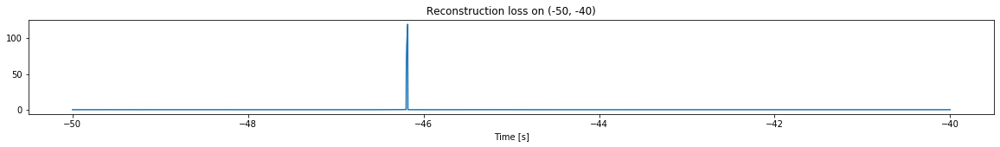

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


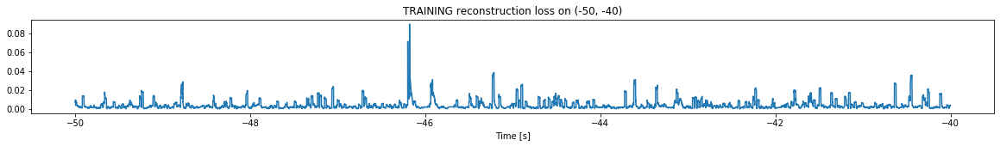

Finished training, median of the log(loss) is:  -2.560680767489221
Triggering for section:  (-40, -30)
Using this median for triggering: -2.255765644171378


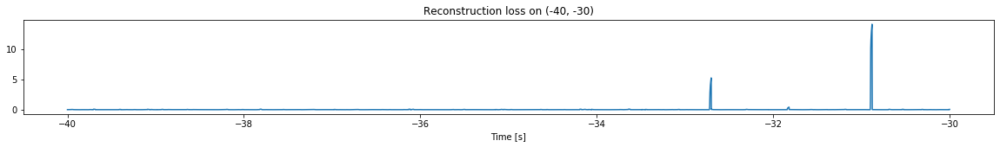

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


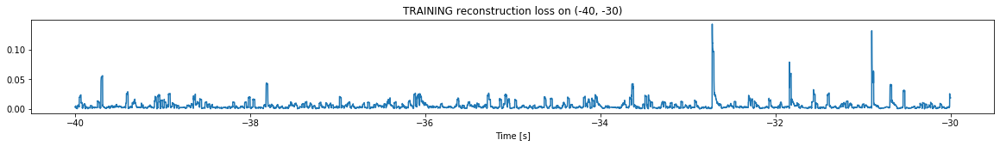

Finished training, median of the log(loss) is:  -2.398666449872664
Triggering for section:  (-30, -20)
Using this median for triggering: -2.560680767489221


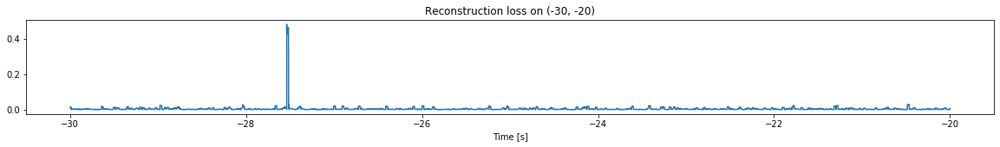

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


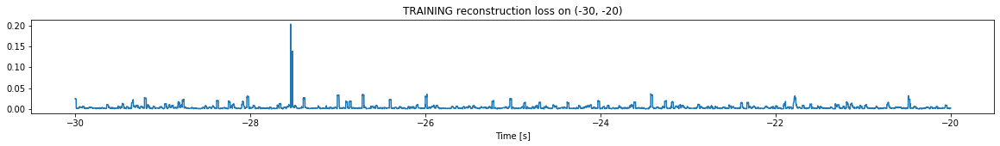

Finished training, median of the log(loss) is:  -2.5590317001401726
Triggering for section:  (-20, -10)
Using this median for triggering: -2.398666449872664


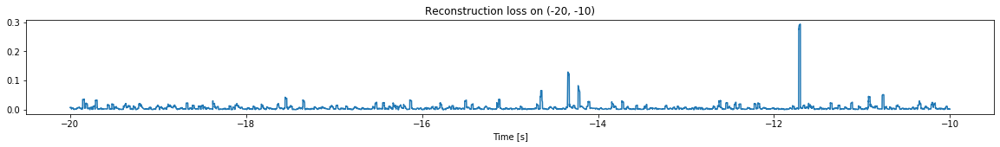

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


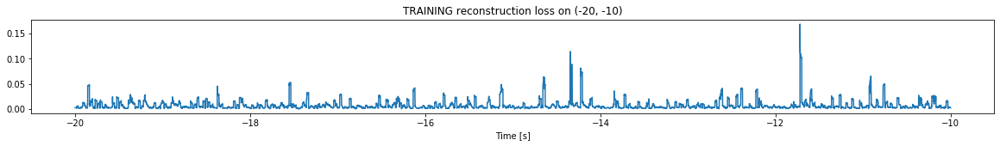

Finished training, median of the log(loss) is:  -2.3301793322198745
Triggering for section:  (-10, 0)
Using this median for triggering: -2.5590317001401726


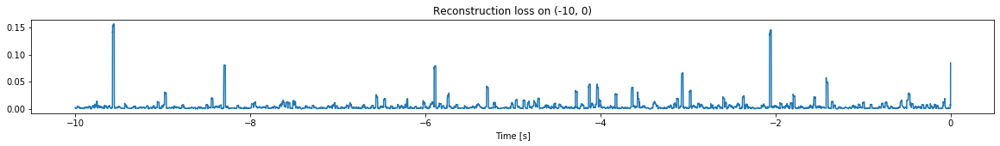

<--------
Finished simulation, all the triggered times are:  [-145.60439, -144.52678, -144.02179, -143.48839, -142.9188, -141.91309, -141.23909, -140.48679, -139.85579, -139.14519, -137.92479, -136.77028, -136.0718, -134.94579, -133.17009, -132.0474, -131.52489, -130.09099]


In [20]:
simulation("./data/Ramp20/", 10, (-212,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1197500, 12)
Flushing input history
Number of sections: 12
Entering sections:  (-120, -110)
-------->
Entering sections:  (-110, -100)
-------->
Training for section:  (None, -110)


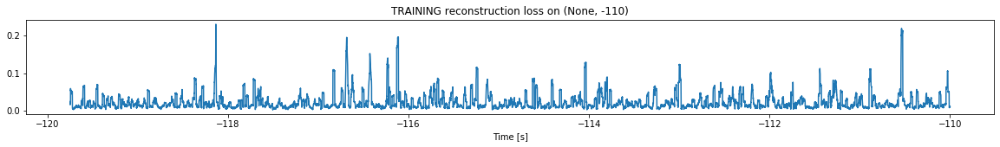

Finished training, median of the log(loss) is:  -1.7990363772351248
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


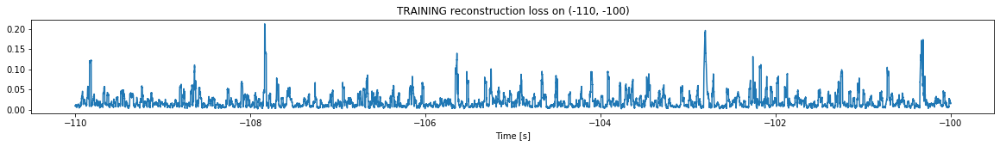

Finished training, median of the log(loss) is:  -1.8368869903793565
Triggering for section:  (-100, -90)
Using this median for triggering: -1.7990363772351248


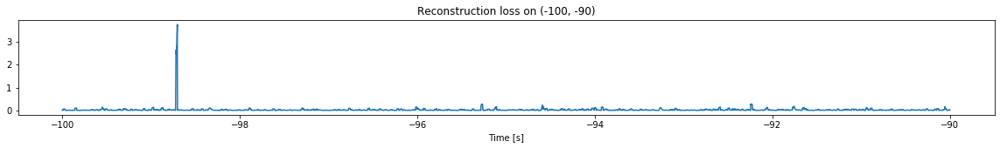

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


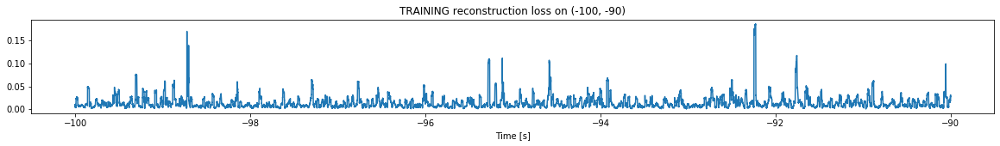

Finished training, median of the log(loss) is:  -1.9842209497948784
Triggering for section:  (-90, -80)
Using this median for triggering: -1.8368869903793565


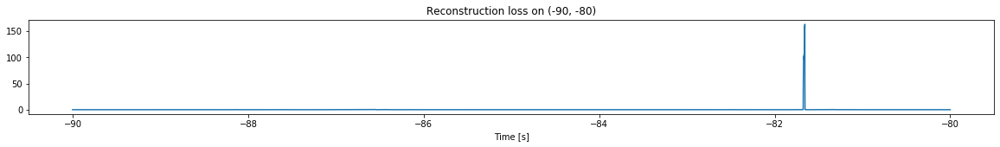

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


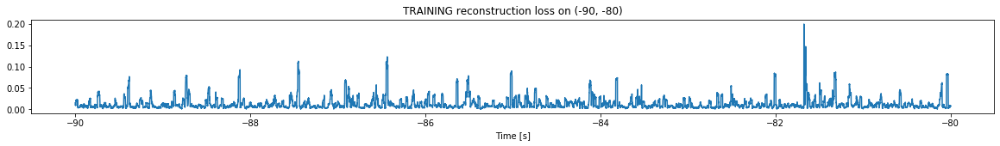

Finished training, median of the log(loss) is:  -2.0568984052495547
Triggering for section:  (-80, -70)
Using this median for triggering: -1.9842209497948784


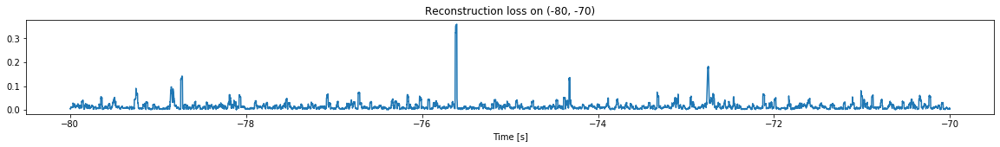

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


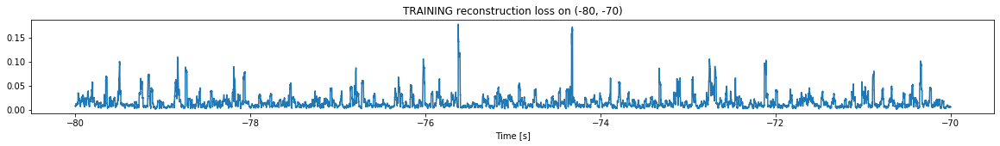

Finished training, median of the log(loss) is:  -1.9441126036619605
Triggering for section:  (-70, -60)
Using this median for triggering: -2.0568984052495547


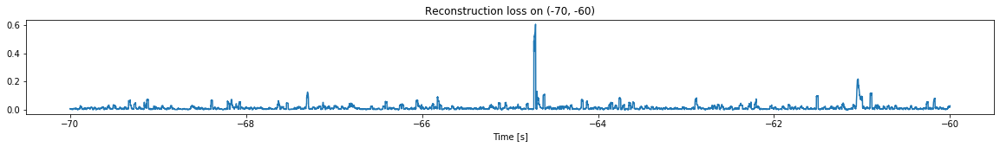

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


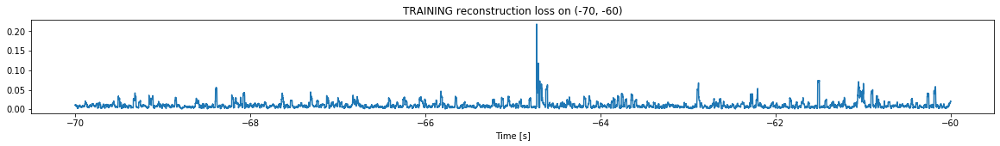

Finished training, median of the log(loss) is:  -2.090492790541882
Triggering for section:  (-60, -50)
Using this median for triggering: -1.9441126036619605


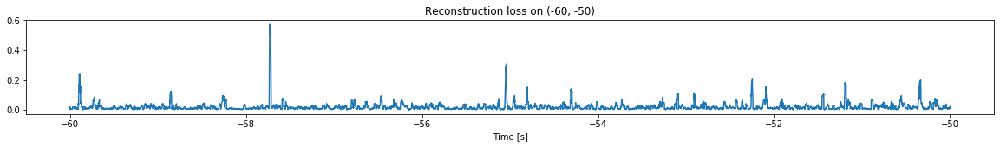

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


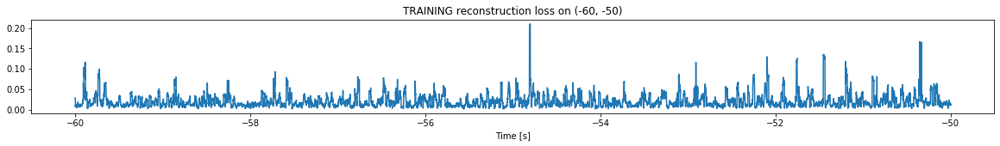

Finished training, median of the log(loss) is:  -1.7953776250615403
Triggering for section:  (-50, -40)
Using this median for triggering: -2.090492790541882


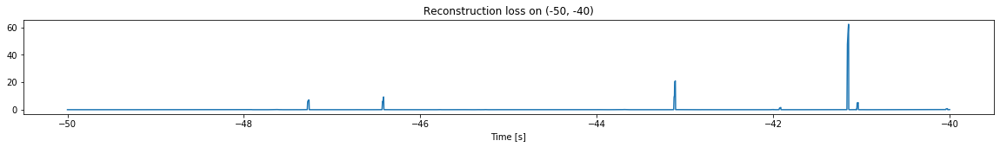

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


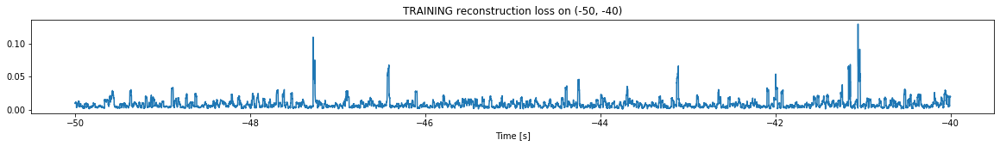

Finished training, median of the log(loss) is:  -2.177542187331393
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7953776250615403


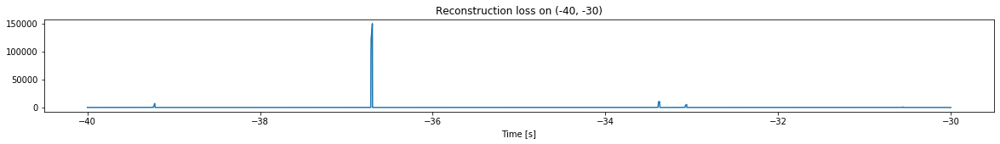

Other trigger time:  [-39.2193   -36.699398 -33.379498]
Their log loss values are:  [5.63312112 6.97014751 5.82587708]


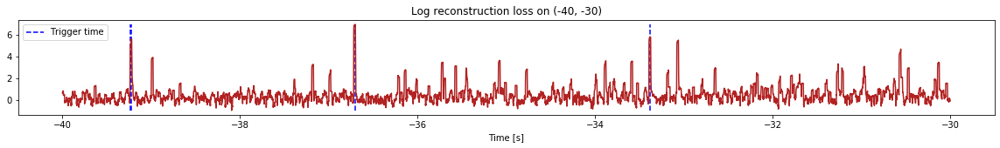

Triggered at:  [-39.2193, -36.699398, -33.379498]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


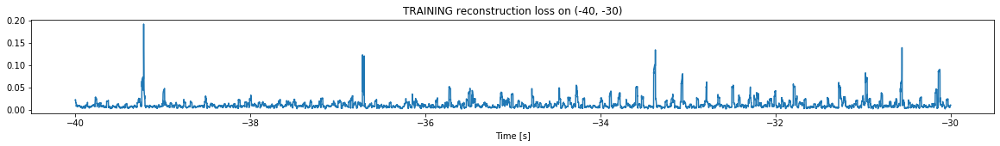

Finished training, median of the log(loss) is:  -2.0802892780663313
Triggering for section:  (-30, -20)
Using this median for triggering: -2.177542187331393


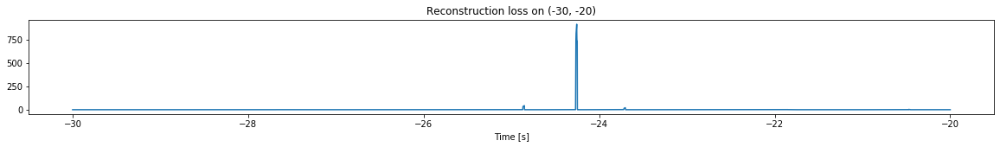

Other trigger time:  [-24.255999]
Their log loss values are:  [5.14139403]


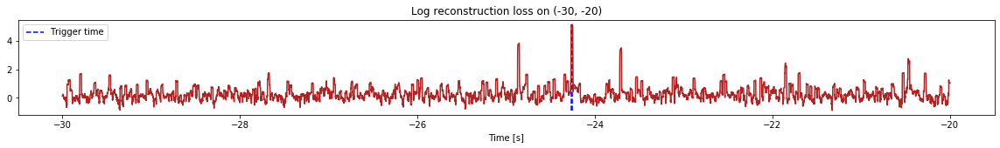

Triggered at:  [-24.255999]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


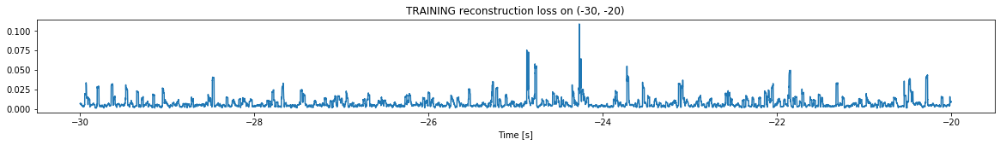

Finished training, median of the log(loss) is:  -2.2935568995419153
Triggering for section:  (-20, -10)
Using this median for triggering: -2.0802892780663313


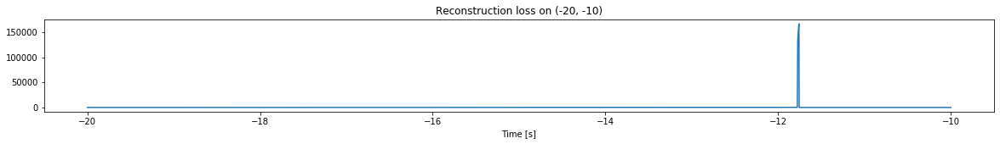

Other trigger time:  [-11.759]
Their log loss values are:  [7.30251191]


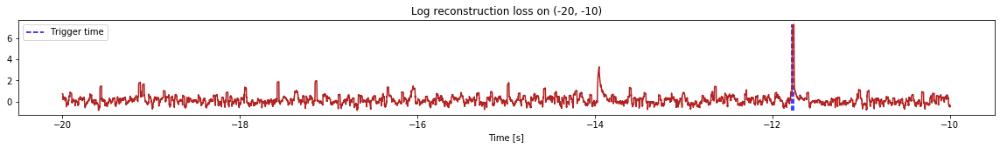

Triggered at:  [-11.759]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


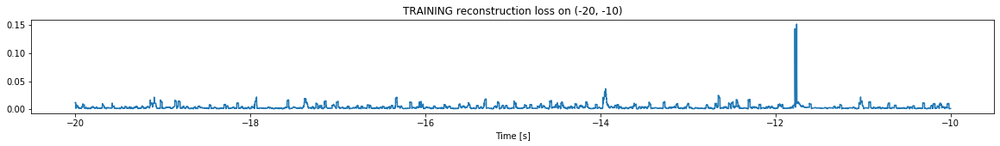

Finished training, median of the log(loss) is:  -2.6027320599452732
Triggering for section:  (-10, 0)
Using this median for triggering: -2.2935568995419153


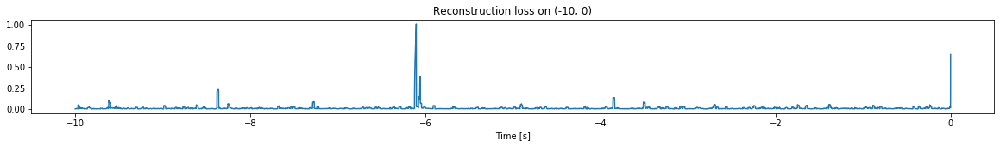

<--------
Finished simulation, all the triggered times are:  [-39.2193, -36.699398, -33.379498, -24.255999, -11.759]


In [21]:
simulation("./data/Ramp21/", 10, (-120,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (797500, 12)
Flushing input history
Number of sections: 8
Entering sections:  (-80, -70)
-------->
Entering sections:  (-70, -60)
-------->
Training for section:  (None, -70)


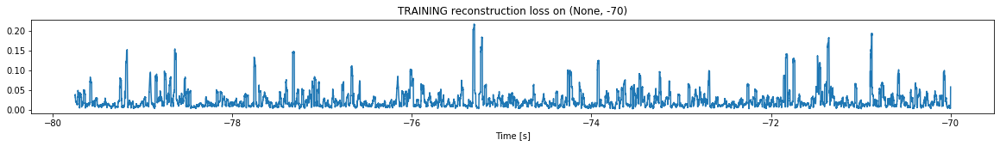

Finished training, median of the log(loss) is:  -1.7661059617954329
<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


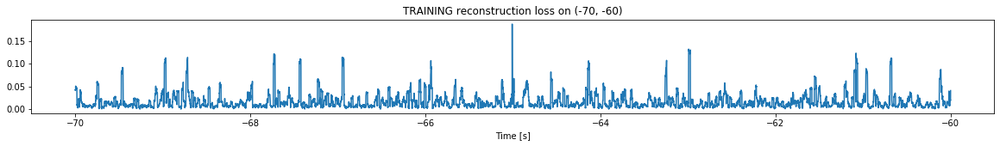

Finished training, median of the log(loss) is:  -1.9168468883284977
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7661059617954329


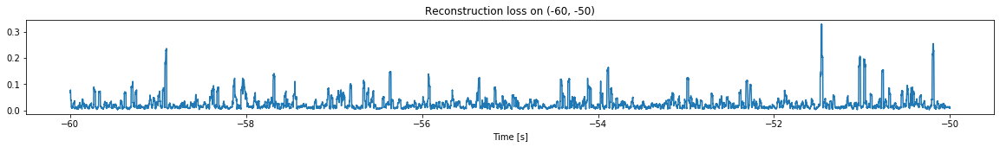

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


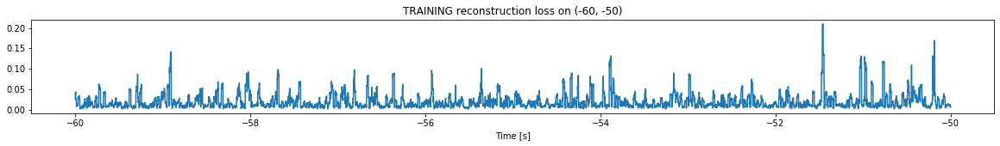

Finished training, median of the log(loss) is:  -1.8721592131956464
Triggering for section:  (-50, -40)
Using this median for triggering: -1.9168468883284977


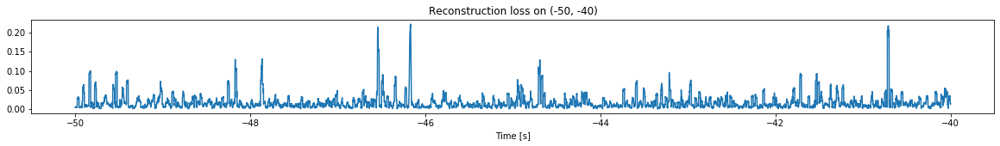

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


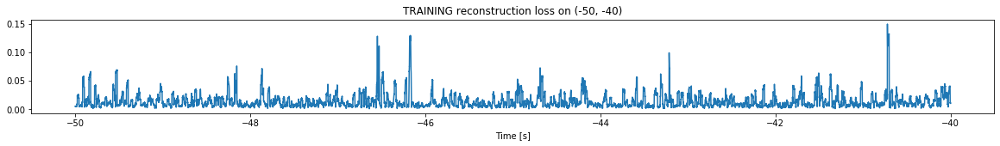

Finished training, median of the log(loss) is:  -1.979568463157137
Triggering for section:  (-40, -30)
Using this median for triggering: -1.8721592131956464


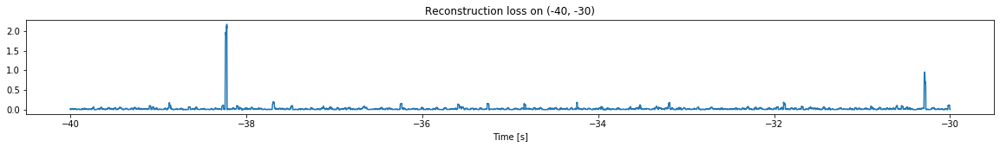

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


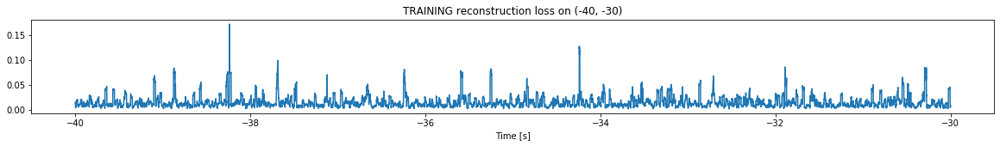

Finished training, median of the log(loss) is:  -1.9314614560401804
Triggering for section:  (-30, -20)
Using this median for triggering: -1.979568463157137


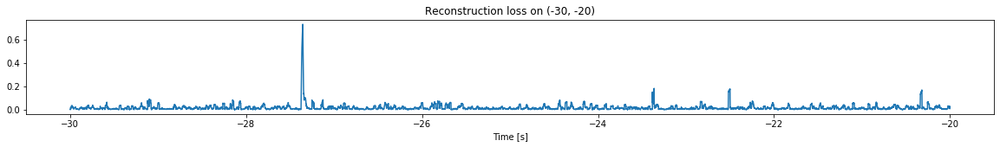

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


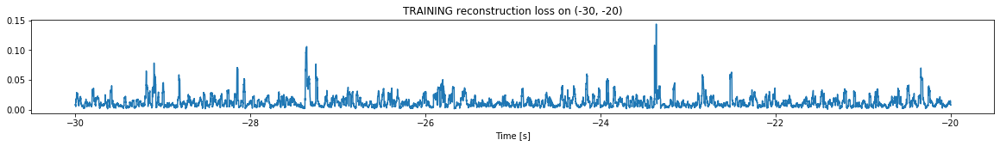

Finished training, median of the log(loss) is:  -2.01266034609841
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9314614560401804


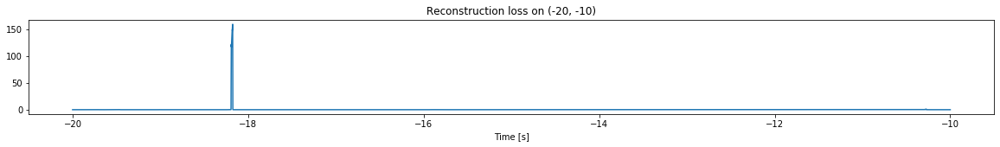

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


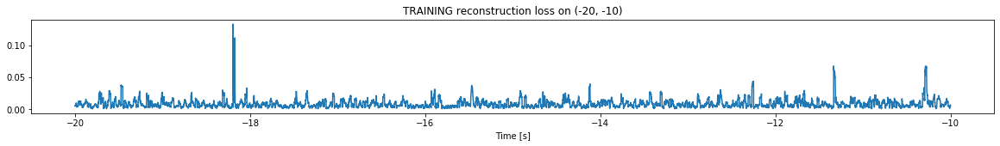

Finished training, median of the log(loss) is:  -2.1432553719408
Triggering for section:  (-10, 0)
Using this median for triggering: -2.01266034609841


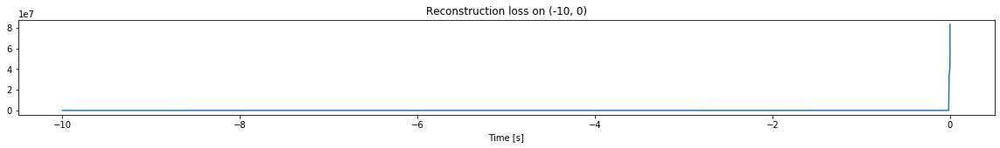

Other trigger time:  []
Their log loss values are:  []


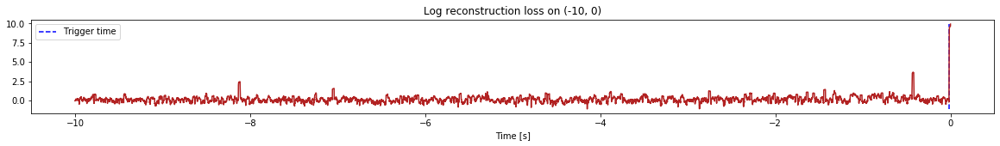

Triggered at:  []
<--------
Finished simulation, all the triggered times are:  []


In [22]:
simulation("./data/Ramp22/", 10, (-80,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (497500, 12)
Flushing input history
Number of sections: 5
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


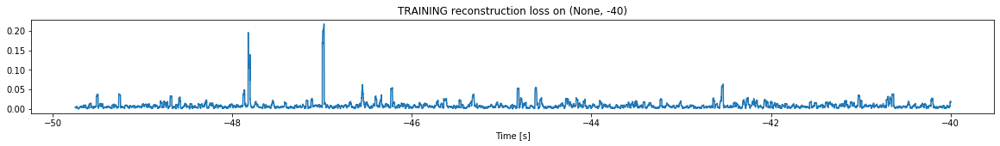

Finished training, median of the log(loss) is:  -2.1276230203696076
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


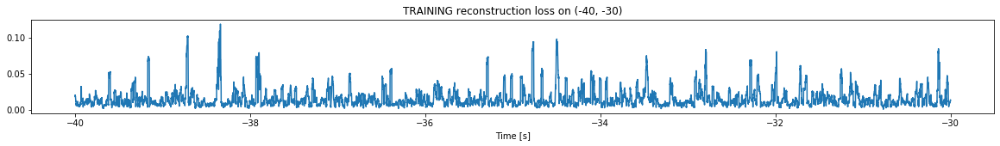

Finished training, median of the log(loss) is:  -1.9170818756252102
Triggering for section:  (-30, -20)
Using this median for triggering: -2.1276230203696076


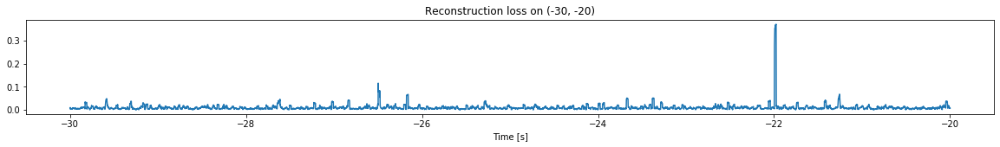

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


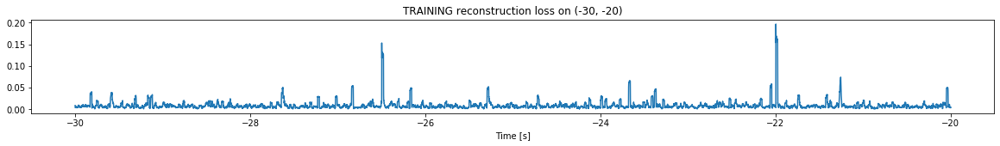

Finished training, median of the log(loss) is:  -2.1465277171432136
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9170818756252102


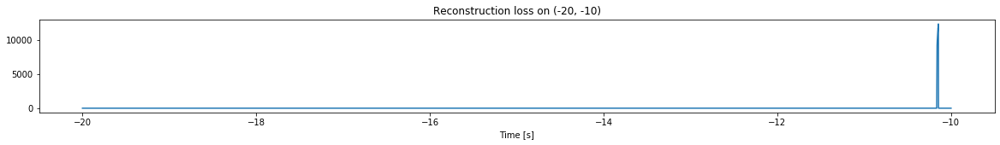

Other trigger time:  [-10.1461]
Their log loss values are:  [6.01015666]


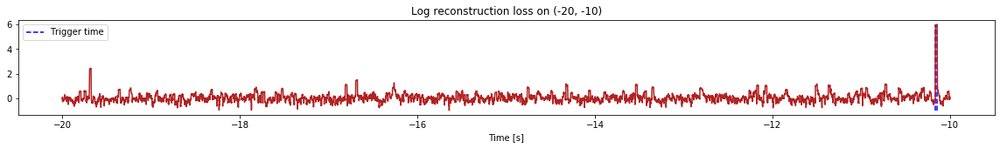

Triggered at:  [-10.1461]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


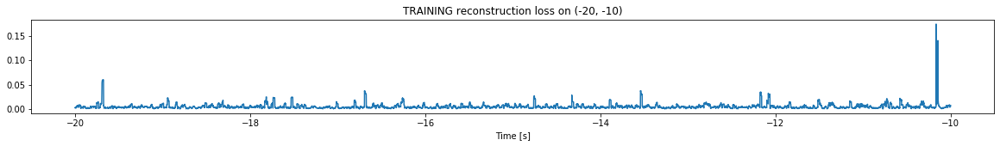

Finished training, median of the log(loss) is:  -2.37821519861834
Triggering for section:  (-10, 0)
Using this median for triggering: -2.1465277171432136


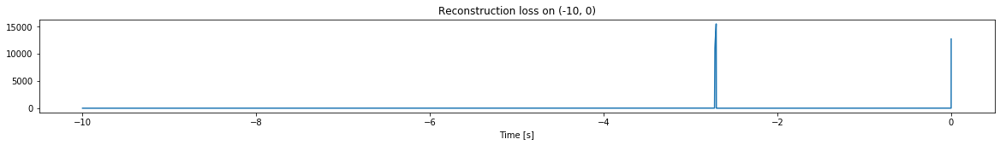

Other trigger time:  [-2.7054]
Their log loss values are:  [6.33801969]


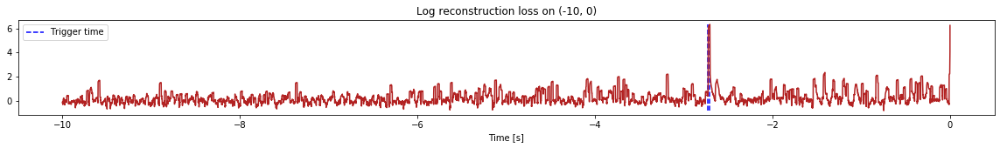

Triggered at:  [-2.7054]
<--------
Finished simulation, all the triggered times are:  [-10.1461, -2.7054]


In [23]:
simulation("./data/Ramp23/", 10, (-50,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1097500, 12)
Flushing input history
Number of sections: 11
Entering sections:  (-110, -100)
-------->
Entering sections:  (-100, -90)
-------->
Training for section:  (None, -100)


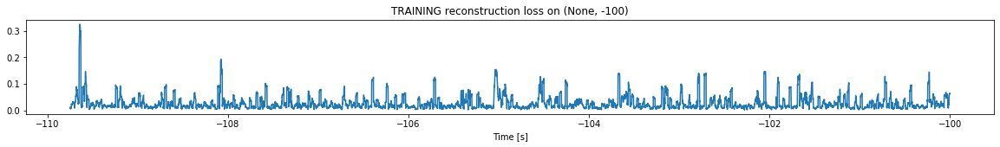

Finished training, median of the log(loss) is:  -1.7281194771763588
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


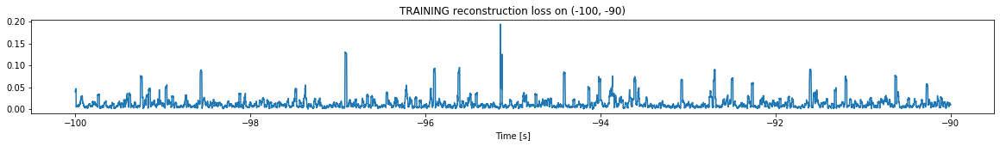

Finished training, median of the log(loss) is:  -2.0171341173322226
Triggering for section:  (-90, -80)
Using this median for triggering: -1.7281194771763588


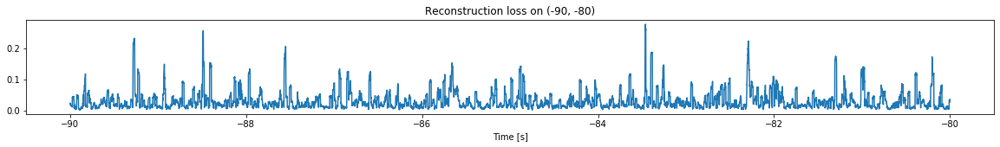

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


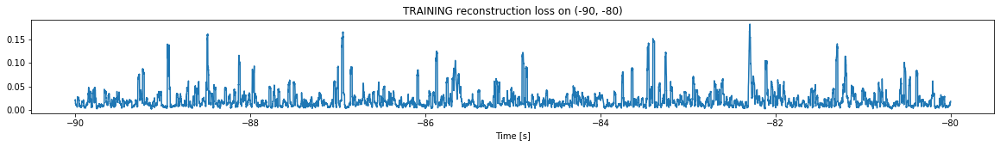

Finished training, median of the log(loss) is:  -1.8195119038289396
Triggering for section:  (-80, -70)
Using this median for triggering: -2.0171341173322226


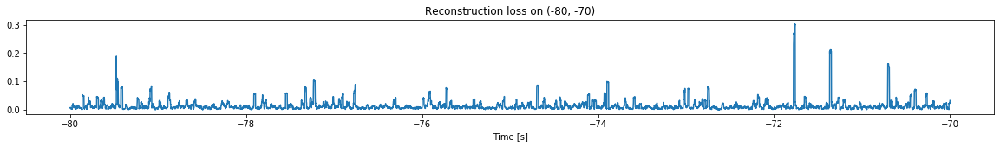

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


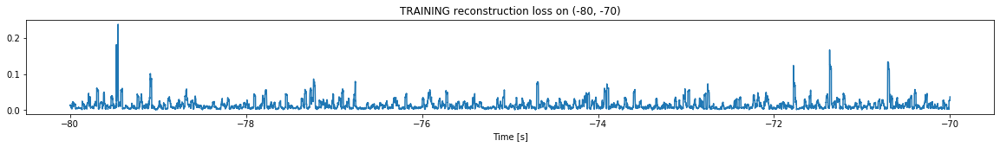

Finished training, median of the log(loss) is:  -2.008321009440454
Triggering for section:  (-70, -60)
Using this median for triggering: -1.8195119038289396


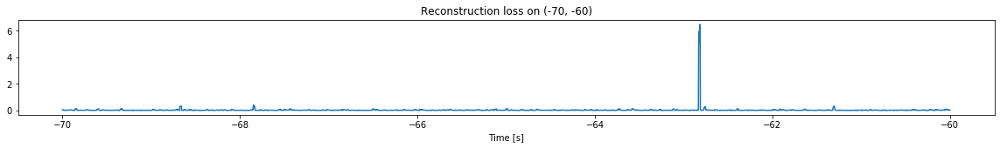

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


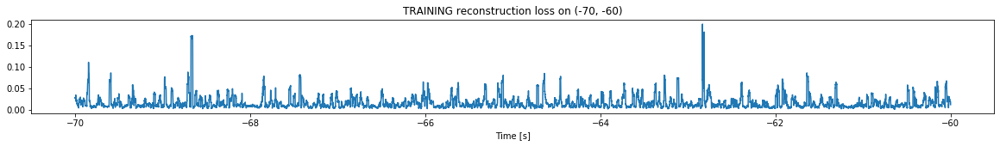

Finished training, median of the log(loss) is:  -1.9302189398106324
Triggering for section:  (-60, -50)
Using this median for triggering: -2.008321009440454


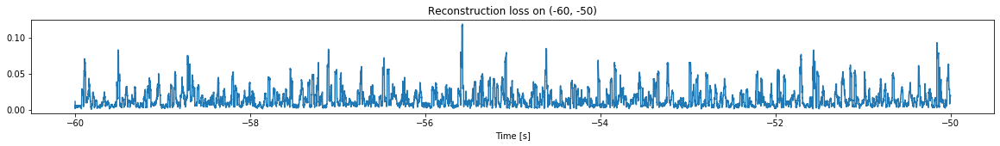

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


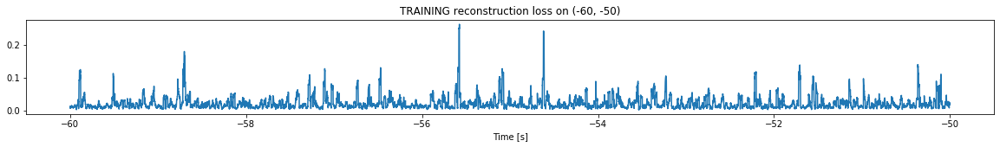

Finished training, median of the log(loss) is:  -1.7787951199570504
Triggering for section:  (-50, -40)
Using this median for triggering: -1.9302189398106324


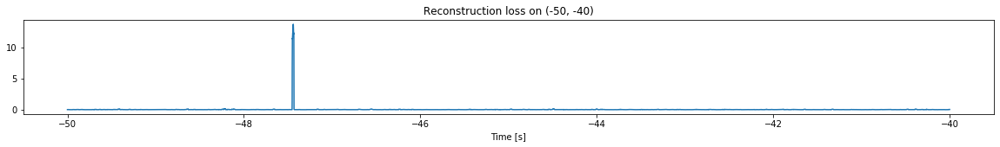

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


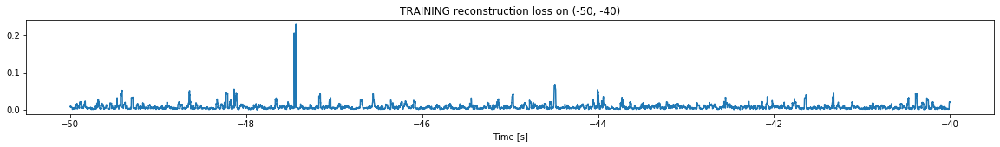

Finished training, median of the log(loss) is:  -2.210429348409405
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7787951199570504


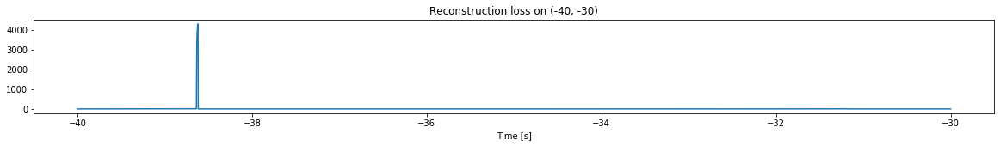

Other trigger time:  [-38.6214]
Their log loss values are:  [5.41125906]


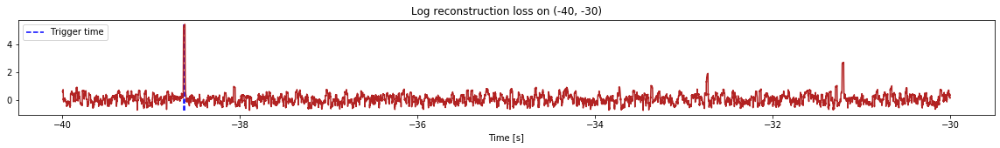

Triggered at:  [-38.6214]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


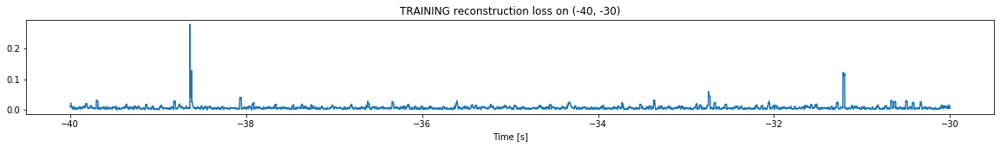

Finished training, median of the log(loss) is:  -2.179666005696925
Triggering for section:  (-30, -20)
Using this median for triggering: -2.210429348409405


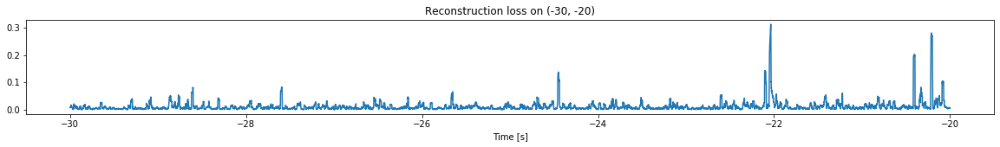

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


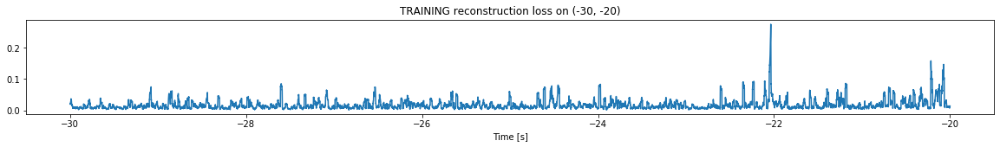

Finished training, median of the log(loss) is:  -1.890515698127563
Triggering for section:  (-20, -10)
Using this median for triggering: -2.179666005696925


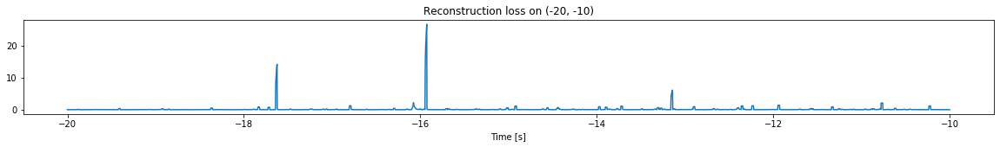

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


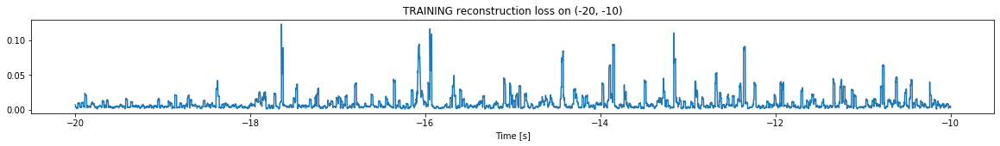

Finished training, median of the log(loss) is:  -2.230241506992848
Triggering for section:  (-10, 0)
Using this median for triggering: -1.890515698127563


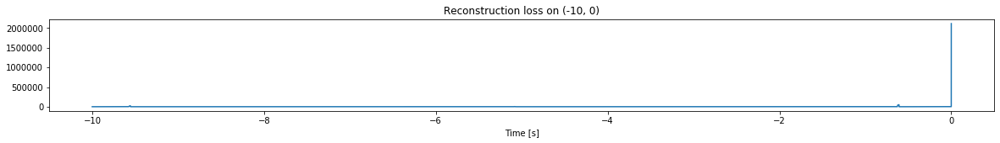

Other trigger time:  [-9.5575 -5.0804 -0.6089]
Their log loss values are:  [6.26705487 5.39762857 6.60087602]


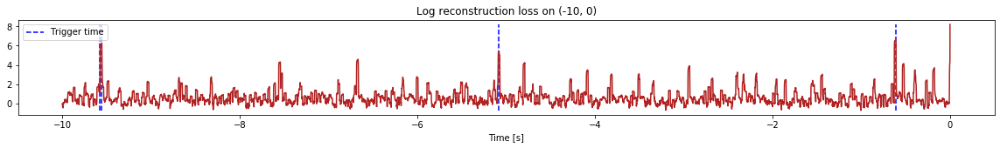

Triggered at:  [-9.5575, -5.0804, -0.6089]
<--------
Finished simulation, all the triggered times are:  [-38.6214, -9.5575, -5.0804, -0.6089]


In [24]:
simulation("./data/Ramp24/", 10, (-110,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


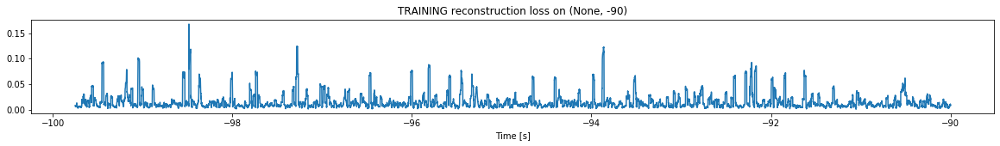

Finished training, median of the log(loss) is:  -1.964283147530144
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


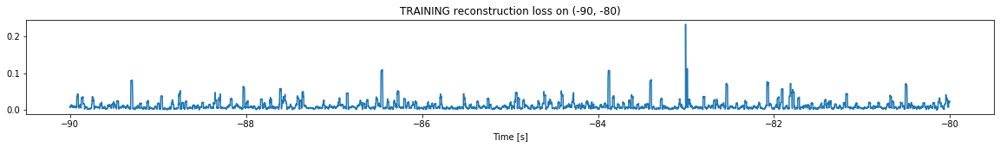

Finished training, median of the log(loss) is:  -2.087389766393242
Triggering for section:  (-80, -70)
Using this median for triggering: -1.964283147530144


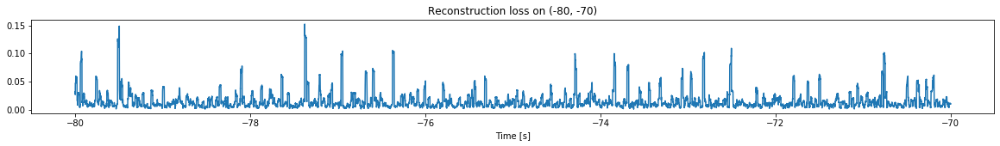

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


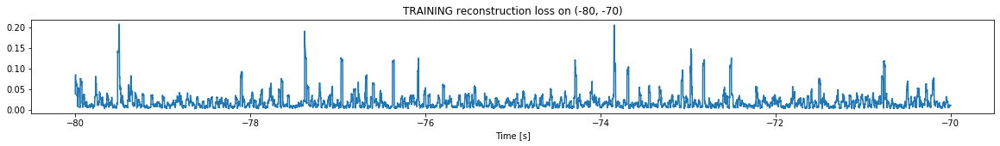

Finished training, median of the log(loss) is:  -1.8613421723610812
Triggering for section:  (-70, -60)
Using this median for triggering: -2.087389766393242


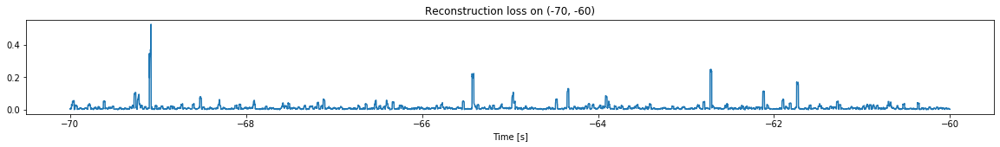

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


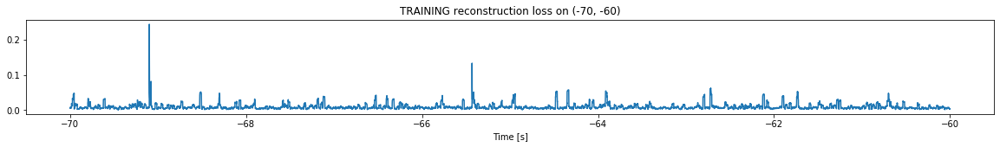

Finished training, median of the log(loss) is:  -2.1220036758116736
Triggering for section:  (-60, -50)
Using this median for triggering: -1.8613421723610812


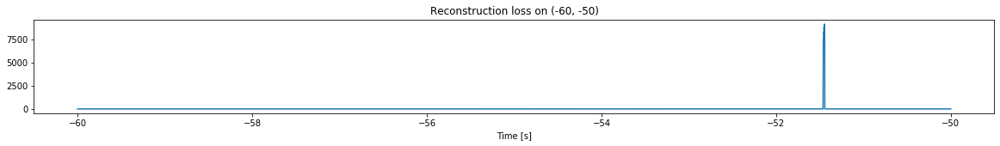

Other trigger time:  [-51.4463]
Their log loss values are:  [5.82406415]


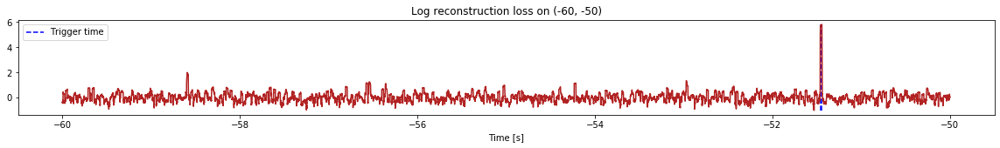

Triggered at:  [-51.4463]
<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


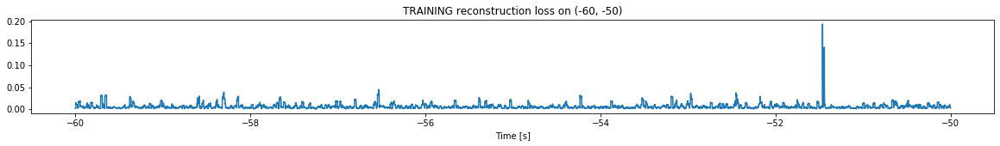

Finished training, median of the log(loss) is:  -2.3146779500526984
Triggering for section:  (-50, -40)
Using this median for triggering: -2.1220036758116736


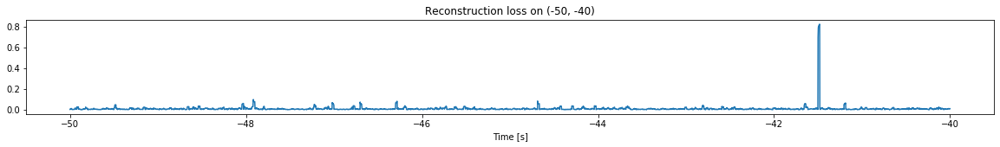

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


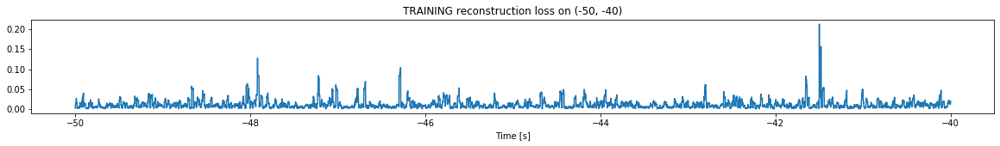

Finished training, median of the log(loss) is:  -2.0266420221606154
Triggering for section:  (-40, -30)
Using this median for triggering: -2.3146779500526984


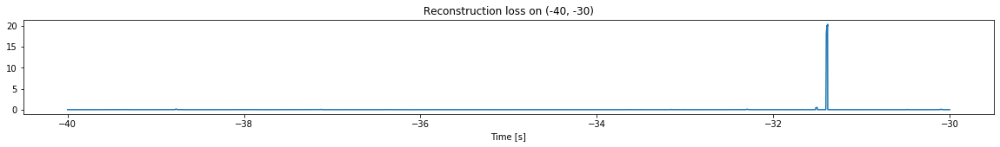

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


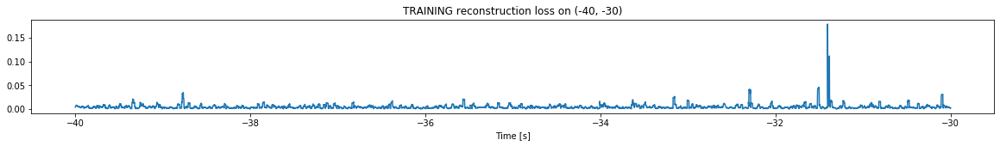

Finished training, median of the log(loss) is:  -2.4087317088732303
Triggering for section:  (-30, -20)
Using this median for triggering: -2.0266420221606154


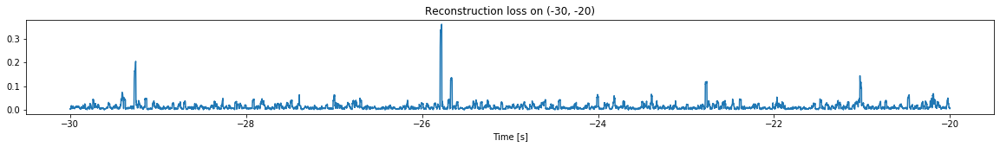

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


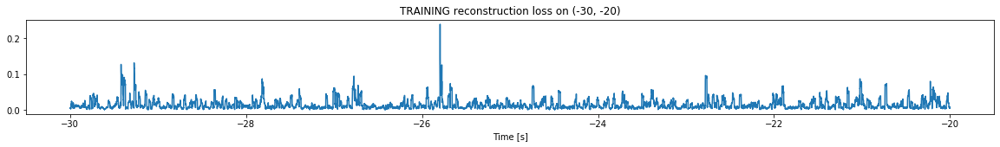

Finished training, median of the log(loss) is:  -1.943022936014693
Triggering for section:  (-20, -10)
Using this median for triggering: -2.4087317088732303


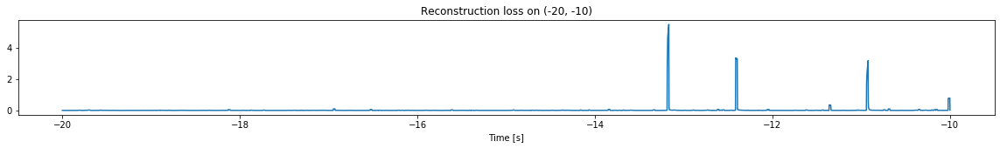

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


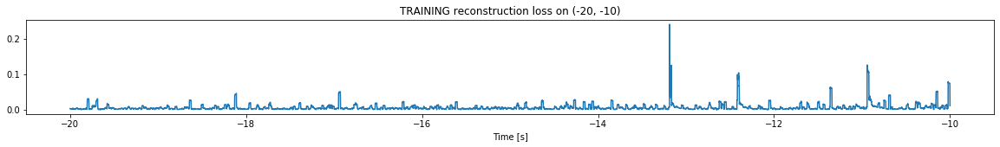

Finished training, median of the log(loss) is:  -2.3718704933922776
Triggering for section:  (-10, 0)
Using this median for triggering: -1.943022936014693


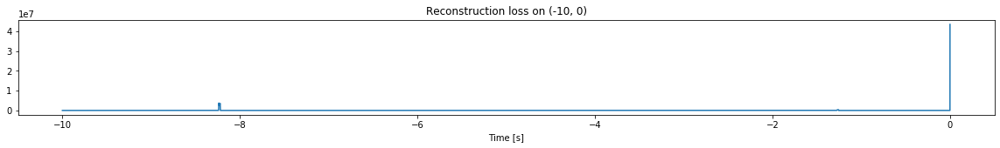

Other trigger time:  [-8.2364    -7.3210998 -5.4825    -1.2574999]
Their log loss values are:  [8.51803687 4.96782847 5.44399075 7.53454843]


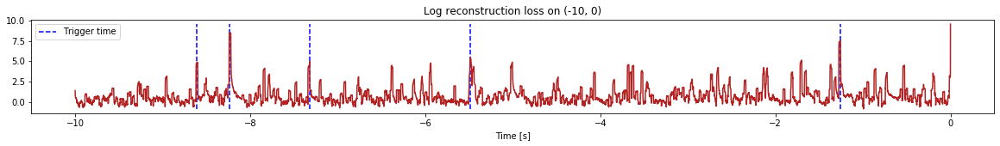

Triggered at:  [-8.2364, -7.3210998, -5.4825, -1.2574999]
<--------
Finished simulation, all the triggered times are:  [-51.4463, -8.2364, -7.3210998, -5.4825, -1.2574999]


In [25]:
simulation("./data/Ramp25/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1097500, 12)
Flushing input history
Number of sections: 11
Entering sections:  (-110, -100)
-------->
Entering sections:  (-100, -90)
-------->
Training for section:  (None, -100)


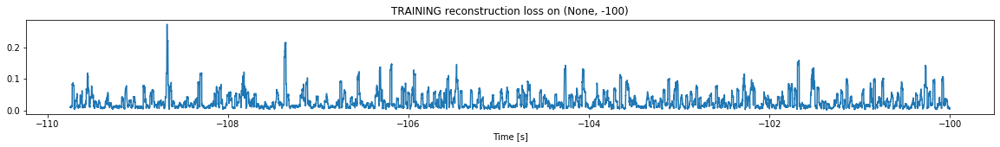

Finished training, median of the log(loss) is:  -1.6938318072015848
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


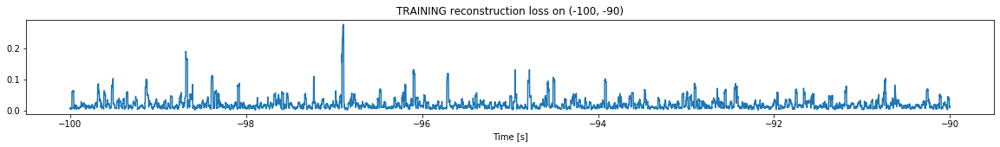

Finished training, median of the log(loss) is:  -1.8324942998035976
Triggering for section:  (-90, -80)
Using this median for triggering: -1.6938318072015848


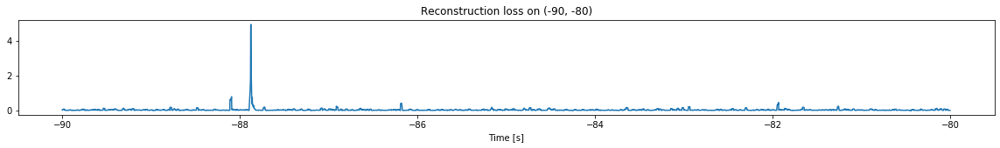

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


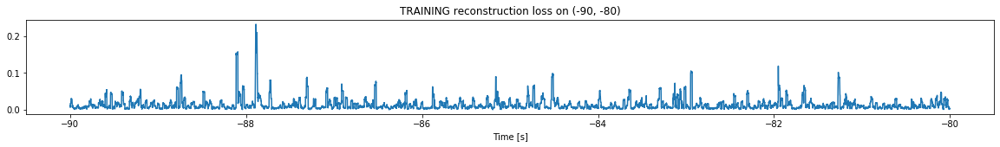

Finished training, median of the log(loss) is:  -1.9962368063916858
Triggering for section:  (-80, -70)
Using this median for triggering: -1.8324942998035976


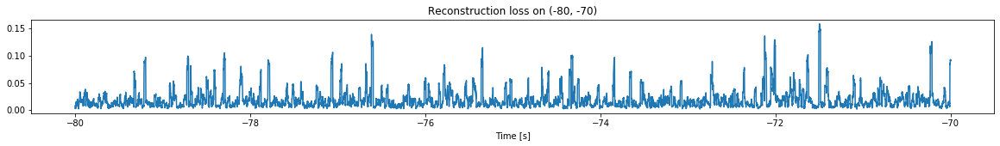

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


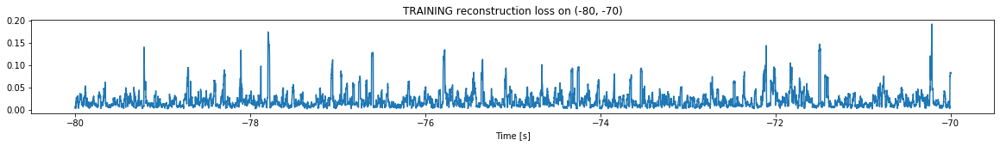

Finished training, median of the log(loss) is:  -1.7925836177104615
Triggering for section:  (-70, -60)
Using this median for triggering: -1.9962368063916858


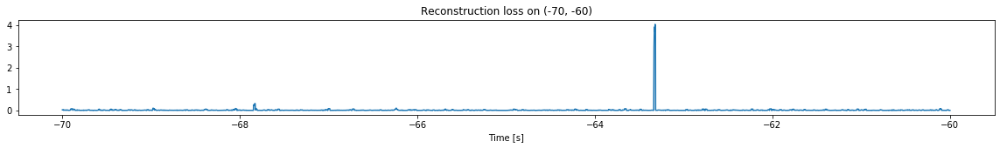

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


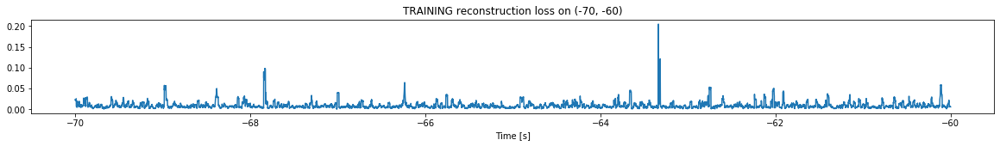

Finished training, median of the log(loss) is:  -2.1200891838669804
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7925836177104615


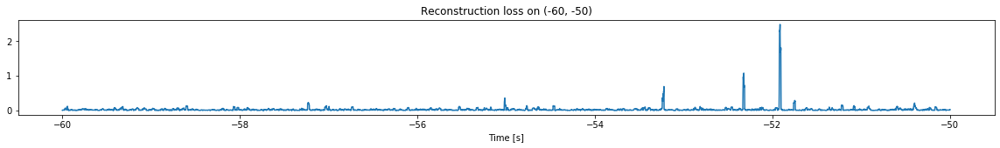

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


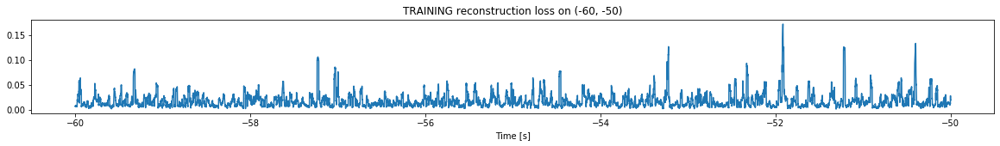

Finished training, median of the log(loss) is:  -1.87703965736435
Triggering for section:  (-50, -40)
Using this median for triggering: -2.1200891838669804


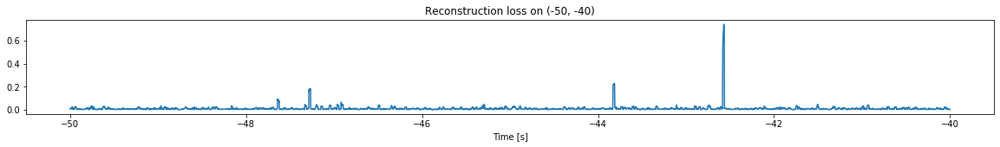

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


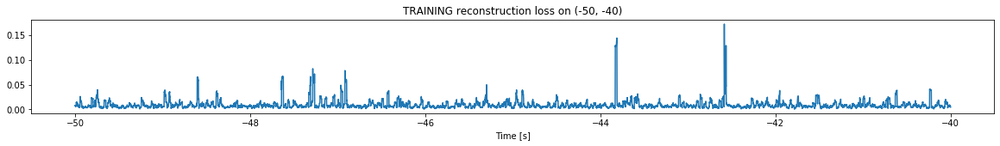

Finished training, median of the log(loss) is:  -2.1413269404602877
Triggering for section:  (-40, -30)
Using this median for triggering: -1.87703965736435


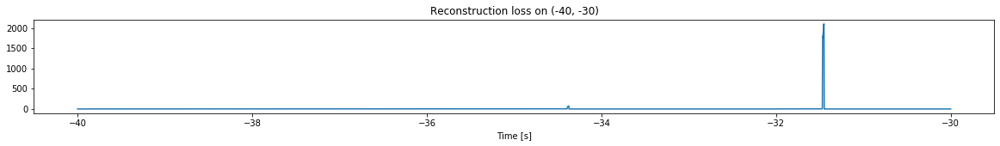

Other trigger time:  [-31.4516]
Their log loss values are:  [5.1995687]


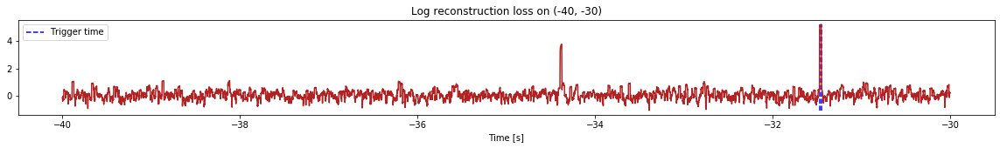

Triggered at:  [-31.4516]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


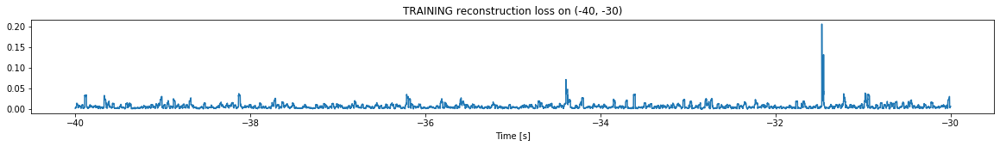

Finished training, median of the log(loss) is:  -2.2452891543121503
Triggering for section:  (-30, -20)
Using this median for triggering: -2.1413269404602877


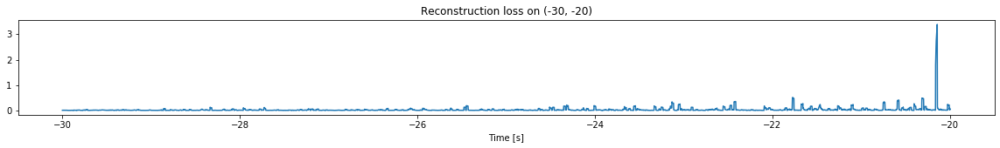

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


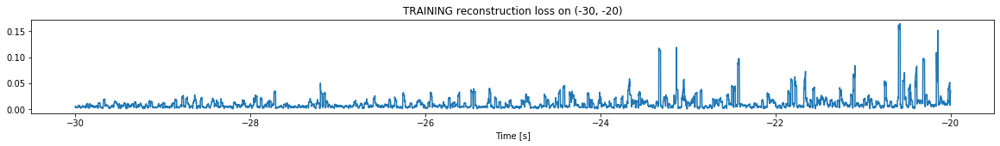

Finished training, median of the log(loss) is:  -2.1124432197684446
Triggering for section:  (-20, -10)
Using this median for triggering: -2.2452891543121503


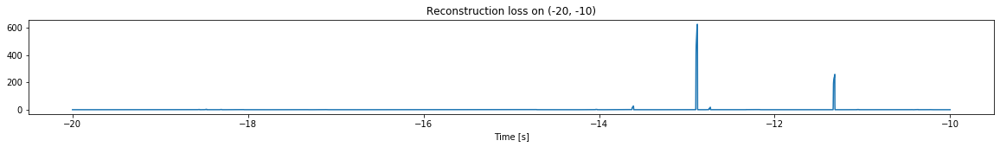

Other trigger time:  [-12.8805]
Their log loss values are:  [5.04266172]


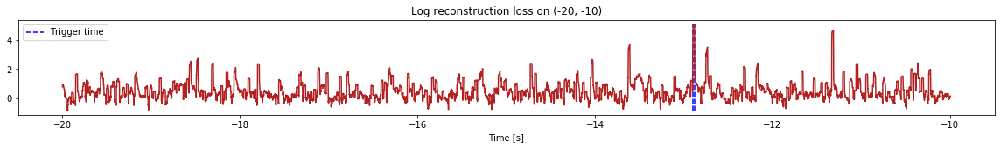

Triggered at:  [-12.8805]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


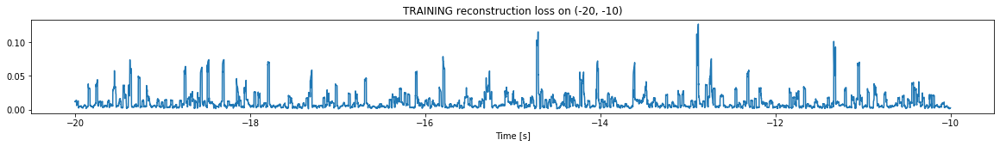

Finished training, median of the log(loss) is:  -2.163754263070962
Triggering for section:  (-10, 0)
Using this median for triggering: -2.1124432197684446


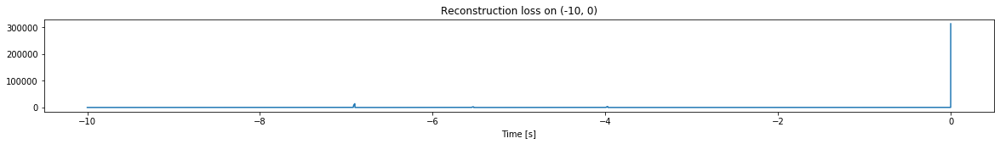

Other trigger time:  [-6.9013 -5.5269 -3.9722]
Their log loss values are:  [6.26591739 5.50046707 5.6606526 ]


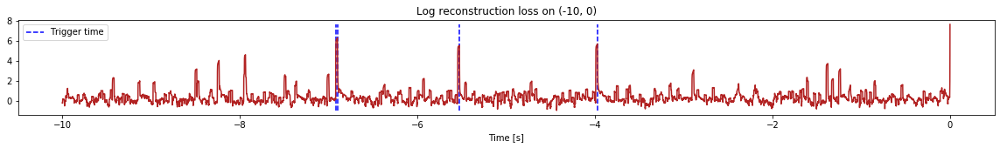

Triggered at:  [-6.9013, -5.5269, -3.9722]
<--------
Finished simulation, all the triggered times are:  [-31.4516, -12.8805, -6.9013, -5.5269, -3.9722]


In [26]:
simulation("./data/Ramp26/", 10, (-110,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (697500, 12)
Flushing input history
Number of sections: 7
Entering sections:  (-70, -60)
-------->
Entering sections:  (-60, -50)
-------->
Training for section:  (None, -60)


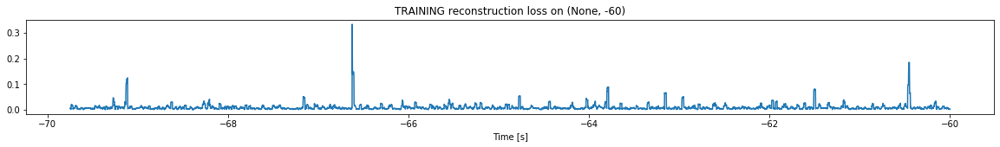

Finished training, median of the log(loss) is:  -2.1210520346604773
<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


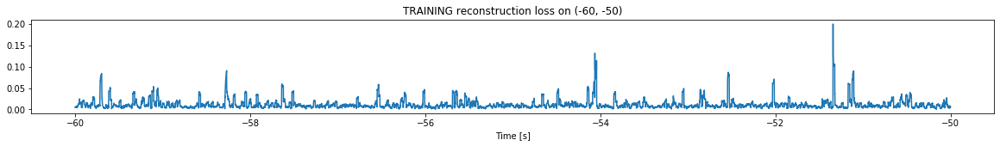

Finished training, median of the log(loss) is:  -2.062730518681255
Triggering for section:  (-50, -40)
Using this median for triggering: -2.1210520346604773


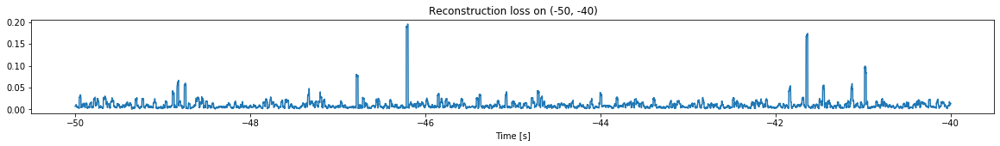

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


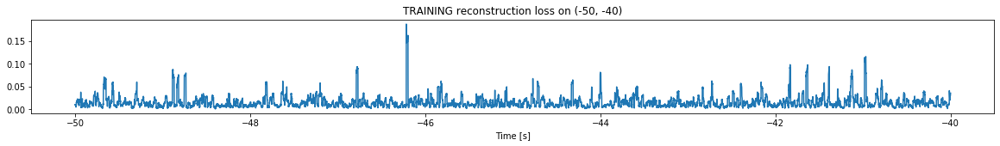

Finished training, median of the log(loss) is:  -1.9010152605254773
Triggering for section:  (-40, -30)
Using this median for triggering: -2.062730518681255


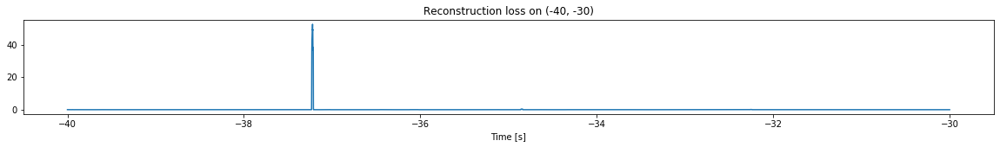

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


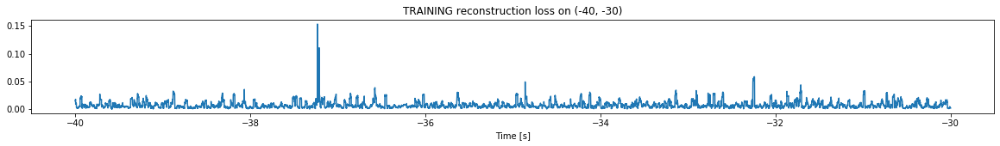

Finished training, median of the log(loss) is:  -2.2100242148799207
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9010152605254773


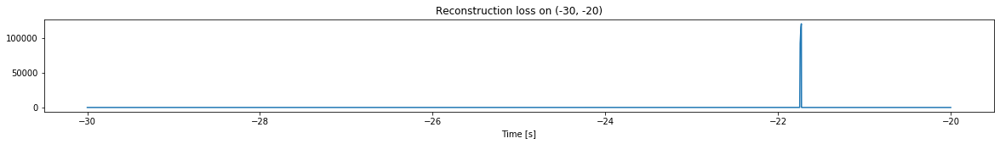

Other trigger time:  [-21.7299]
Their log loss values are:  [6.98223219]


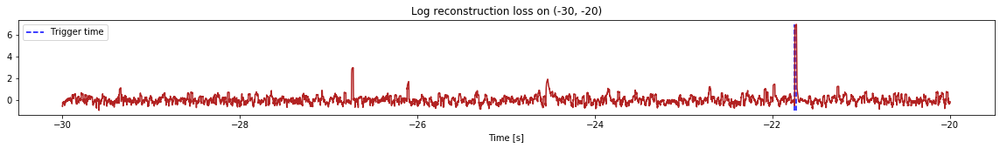

Triggered at:  [-21.7299]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


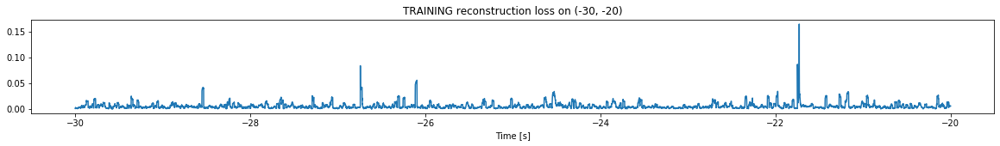

Finished training, median of the log(loss) is:  -2.3231525015787047
Triggering for section:  (-20, -10)
Using this median for triggering: -2.2100242148799207


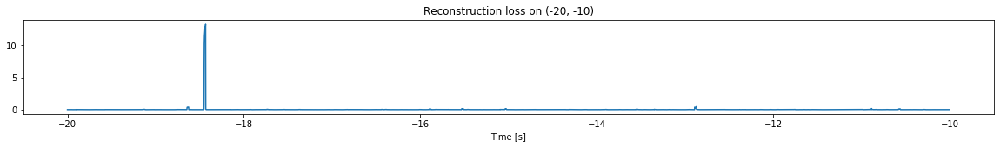

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


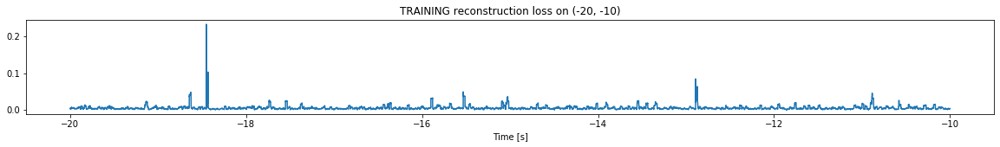

Finished training, median of the log(loss) is:  -2.3576477079941034
Triggering for section:  (-10, 0)
Using this median for triggering: -2.3231525015787047


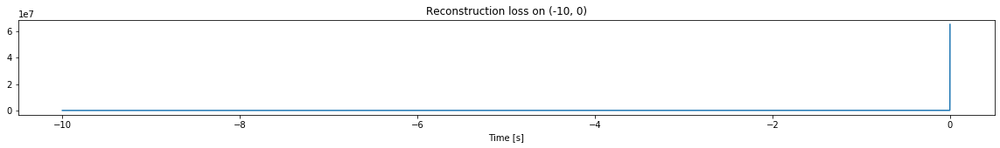

Other trigger time:  []
Their log loss values are:  []


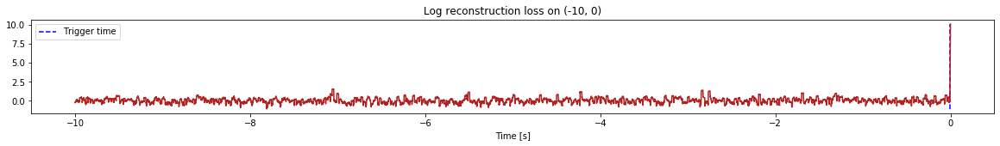

Triggered at:  []
<--------
Finished simulation, all the triggered times are:  [-21.7299]


In [27]:
simulation("./data/Ramp27/", 10, (-70,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (597500, 12)
Flushing input history
Number of sections: 6
Entering sections:  (-60, -50)
-------->
Entering sections:  (-50, -40)
-------->
Training for section:  (None, -50)


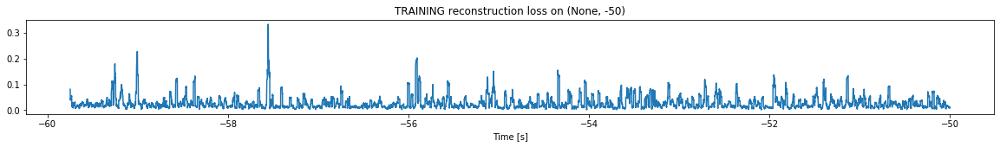

Finished training, median of the log(loss) is:  -1.6944044883167309
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


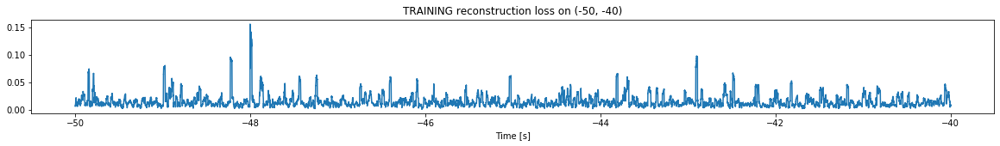

Finished training, median of the log(loss) is:  -1.9233354709770047
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6944044883167309


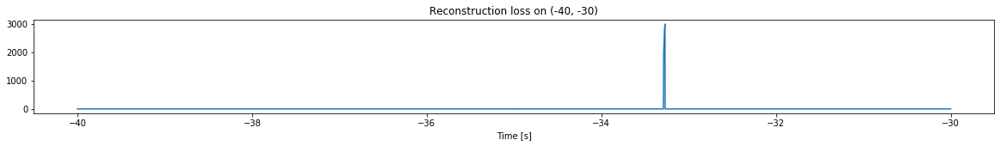

Other trigger time:  [-33.271297]
Their log loss values are:  [5.17158755]


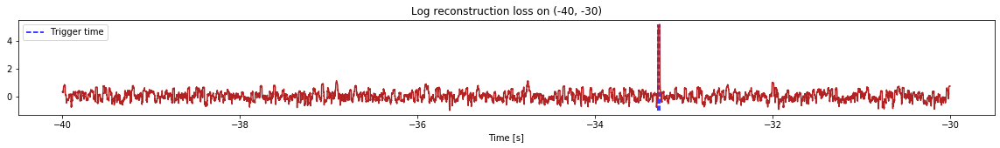

Triggered at:  [-33.271297]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


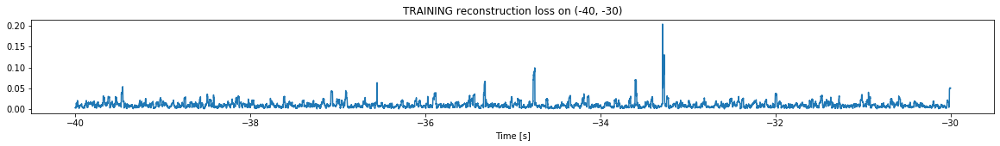

Finished training, median of the log(loss) is:  -2.0505043300657393
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9233354709770047


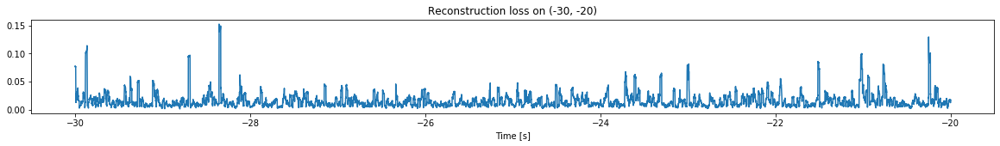

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


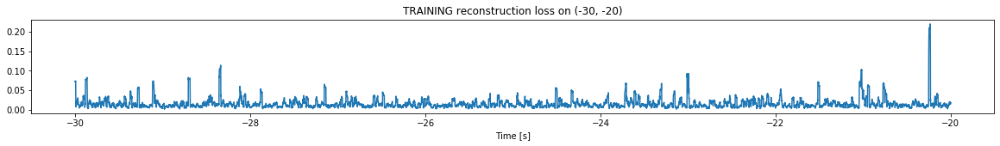

Finished training, median of the log(loss) is:  -1.9027764798965179
Triggering for section:  (-20, -10)
Using this median for triggering: -2.0505043300657393


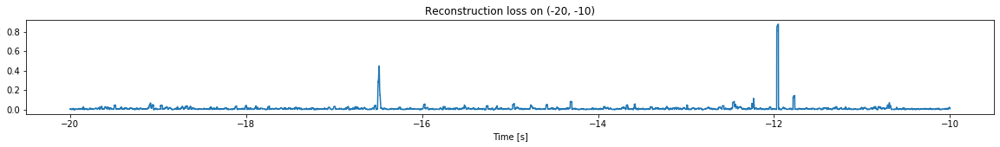

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


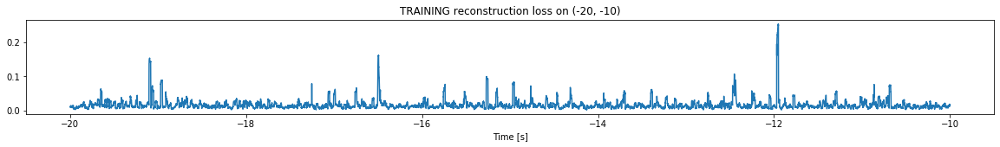

Finished training, median of the log(loss) is:  -1.8882628291192702
Triggering for section:  (-10, 0)
Using this median for triggering: -1.9027764798965179


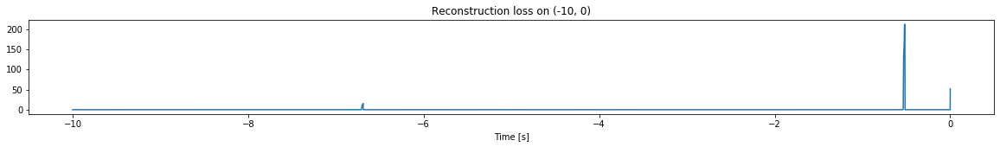

<--------
Finished simulation, all the triggered times are:  [-33.271297]


In [28]:
simulation("./data/Ramp28/", 10, (-60,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


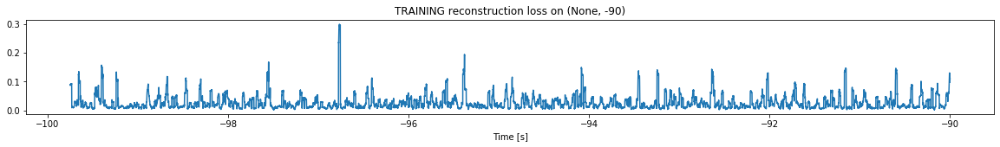

Finished training, median of the log(loss) is:  -1.7038649664864554
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


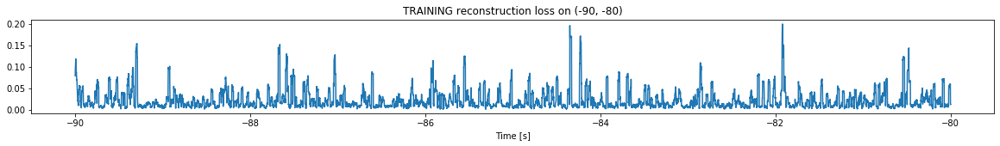

Finished training, median of the log(loss) is:  -1.8232855496024443
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7038649664864554


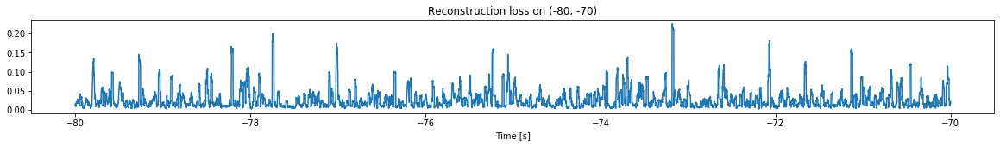

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


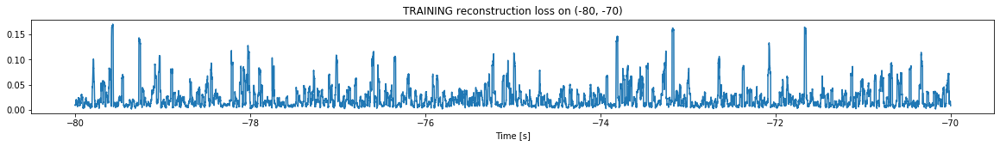

Finished training, median of the log(loss) is:  -1.7770166779055945
Triggering for section:  (-70, -60)
Using this median for triggering: -1.8232855496024443


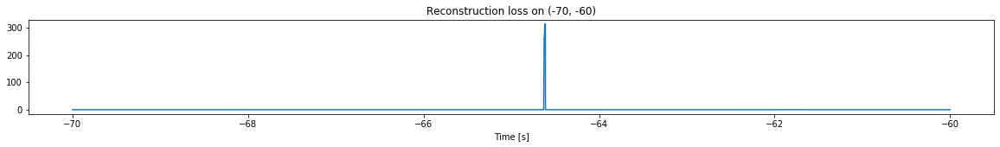

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


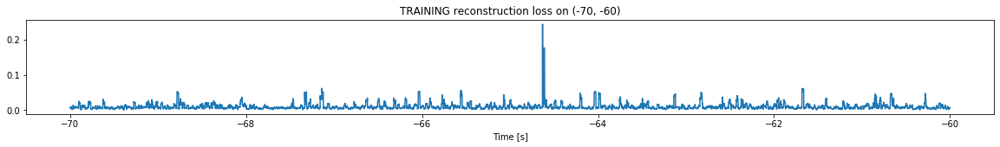

Finished training, median of the log(loss) is:  -2.0982552193497814
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7770166779055945


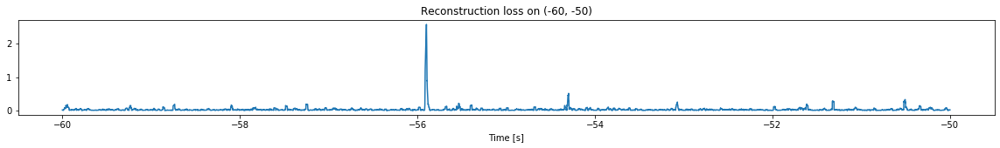

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


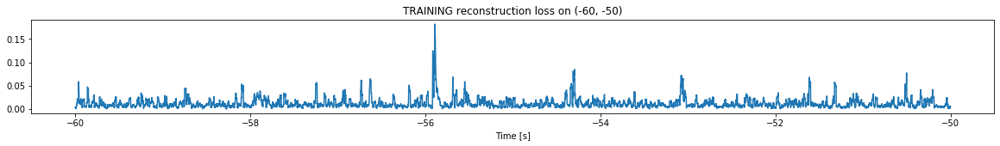

Finished training, median of the log(loss) is:  -1.9966300474293697
Triggering for section:  (-50, -40)
Using this median for triggering: -2.0982552193497814


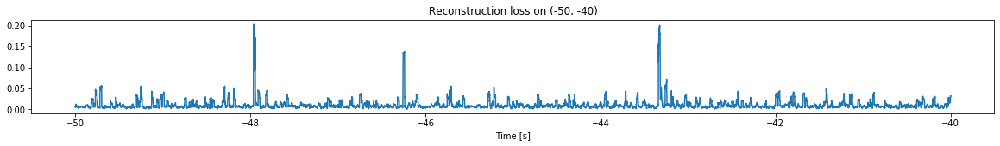

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


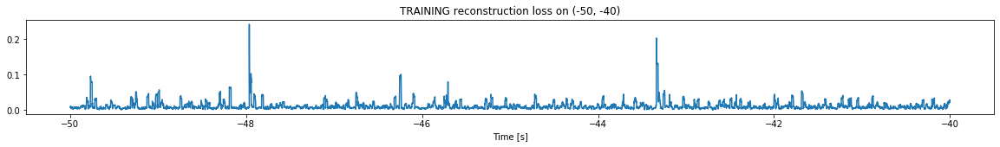

Finished training, median of the log(loss) is:  -2.071068215153728
Triggering for section:  (-40, -30)
Using this median for triggering: -1.9966300474293697


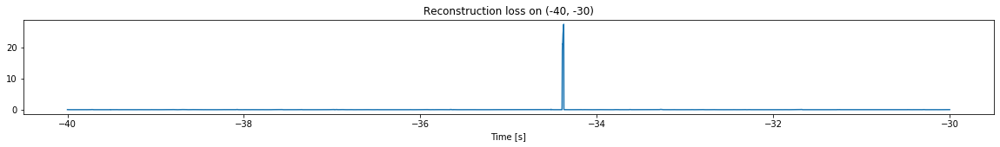

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


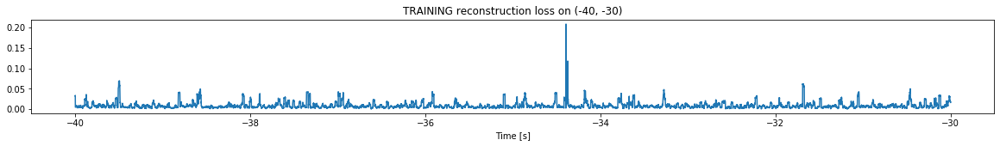

Finished training, median of the log(loss) is:  -2.1556920492291756
Triggering for section:  (-30, -20)
Using this median for triggering: -2.071068215153728


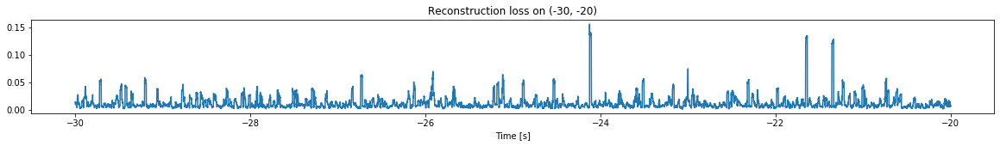

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


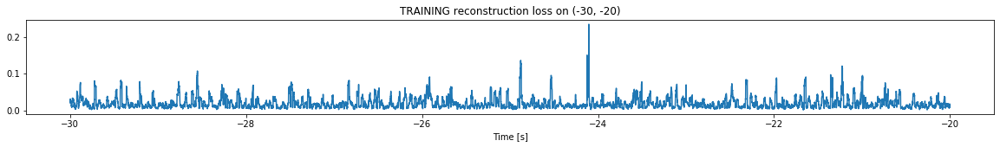

Finished training, median of the log(loss) is:  -1.8319096391656378
Triggering for section:  (-20, -10)
Using this median for triggering: -2.1556920492291756


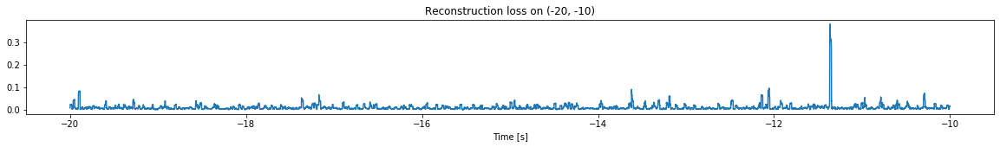

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


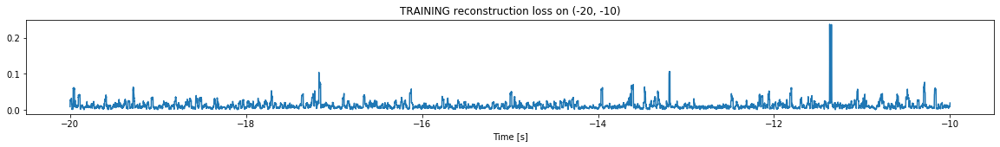

Finished training, median of the log(loss) is:  -1.989764190607442
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8319096391656378


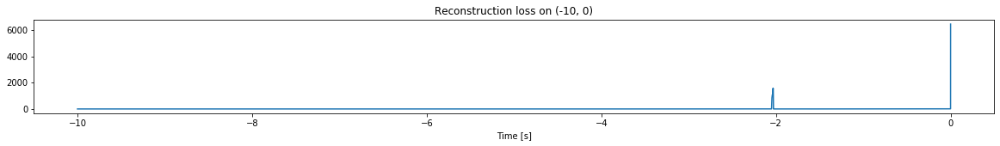

Other trigger time:  [-2.0335]
Their log loss values are:  [5.03015665]


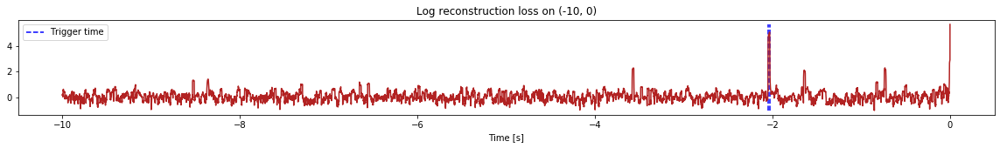

Triggered at:  [-2.0335]
<--------
Finished simulation, all the triggered times are:  [-2.0335]


In [15]:
simulation("./data/Ramp29/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1197500, 12)
Flushing input history
Number of sections: 12
Entering sections:  (-120, -110)
-------->
Entering sections:  (-110, -100)
-------->
Training for section:  (None, -110)


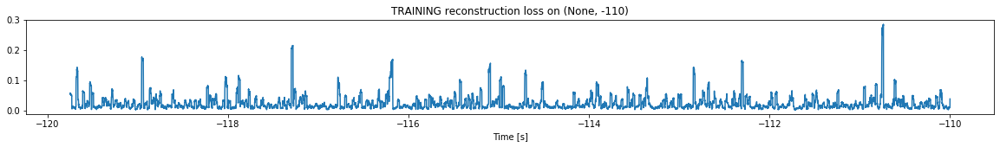

Finished training, median of the log(loss) is:  -1.7523144941438091
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


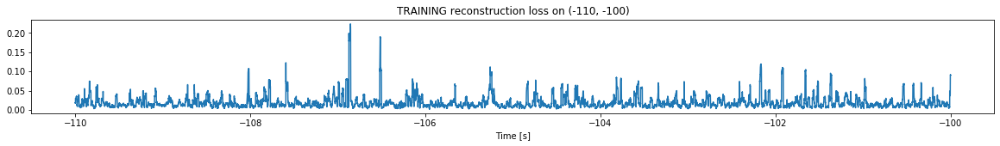

Finished training, median of the log(loss) is:  -1.8285164670696759
Triggering for section:  (-100, -90)
Using this median for triggering: -1.7523144941438091


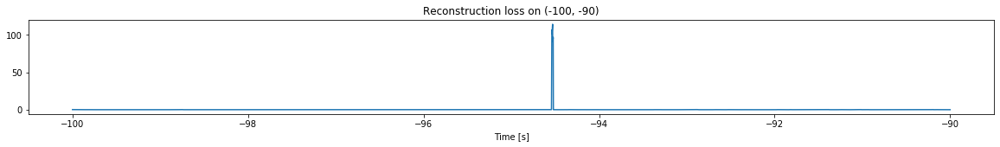

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


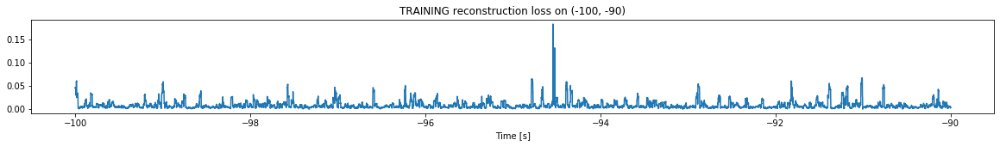

Finished training, median of the log(loss) is:  -2.19841034965736
Triggering for section:  (-90, -80)
Using this median for triggering: -1.8285164670696759


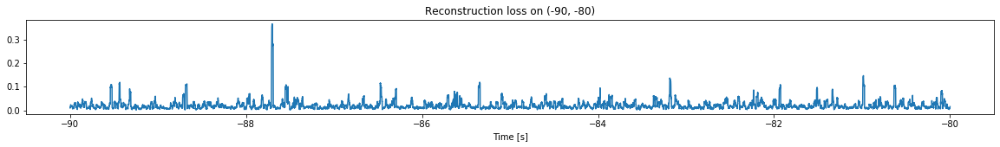

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


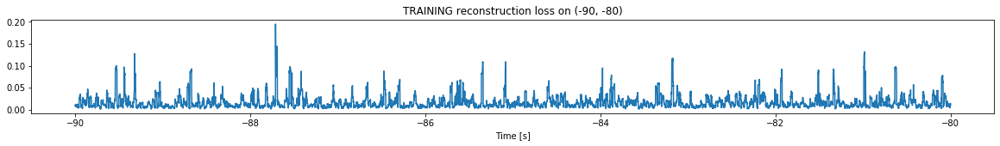

Finished training, median of the log(loss) is:  -1.891963412032619
Triggering for section:  (-80, -70)
Using this median for triggering: -2.19841034965736


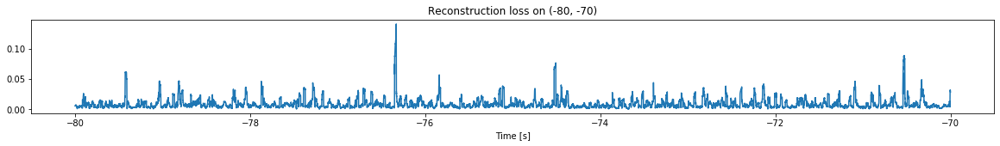

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


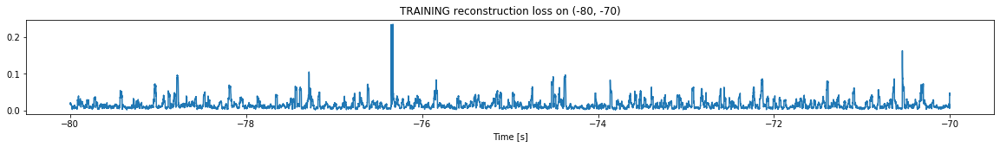

Finished training, median of the log(loss) is:  -1.9413223804233914
Triggering for section:  (-70, -60)
Using this median for triggering: -1.891963412032619


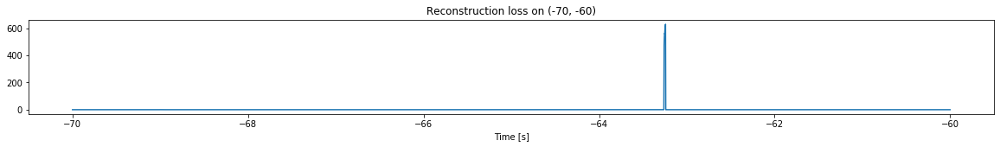

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


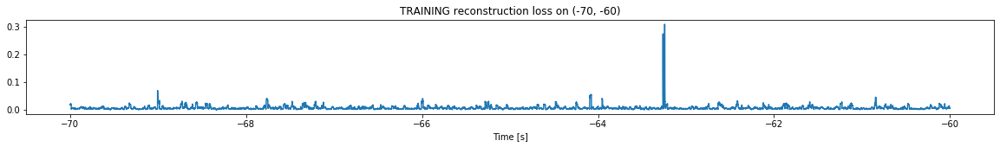

Finished training, median of the log(loss) is:  -2.257005039433661
Triggering for section:  (-60, -50)
Using this median for triggering: -1.9413223804233914


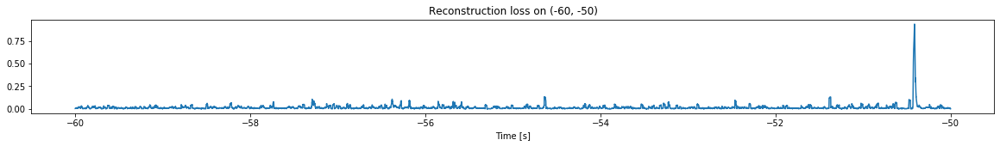

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


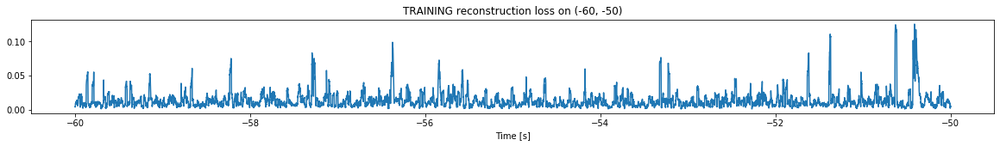

Finished training, median of the log(loss) is:  -1.9635501972084561
Triggering for section:  (-50, -40)
Using this median for triggering: -2.257005039433661


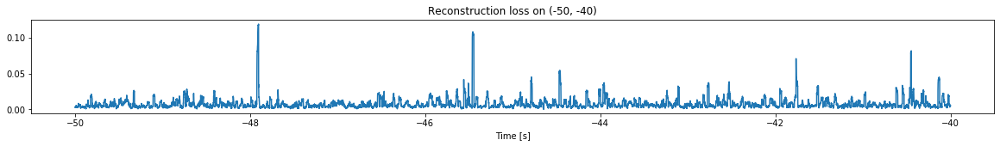

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


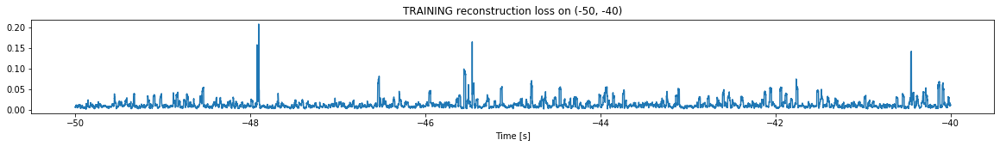

Finished training, median of the log(loss) is:  -2.0044763720339662
Triggering for section:  (-40, -30)
Using this median for triggering: -1.9635501972084561


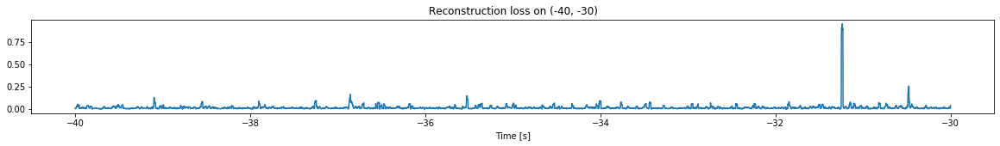

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


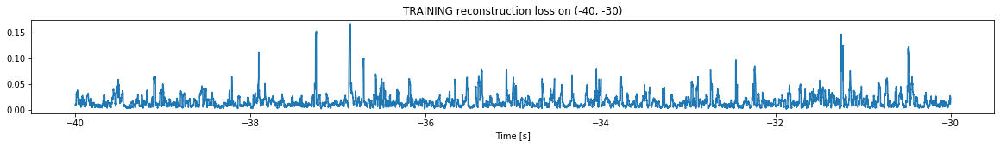

Finished training, median of the log(loss) is:  -1.9060534856681555
Triggering for section:  (-30, -20)
Using this median for triggering: -2.0044763720339662


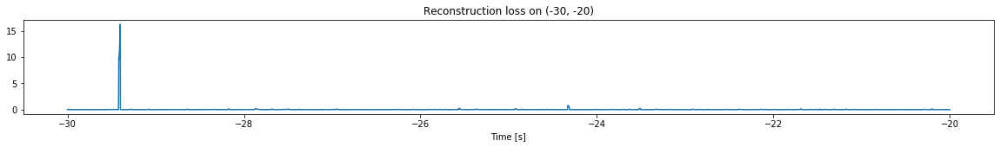

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


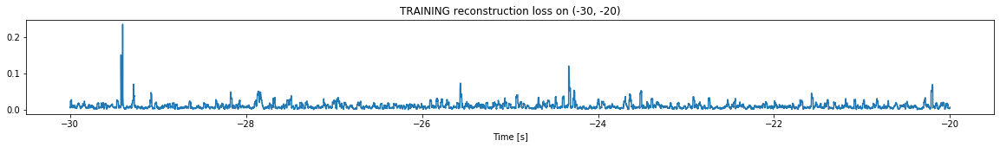

Finished training, median of the log(loss) is:  -2.04727934628008
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9060534856681555


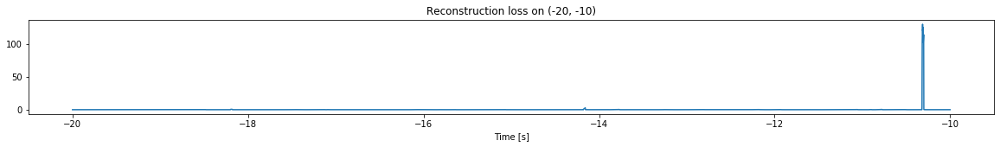

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


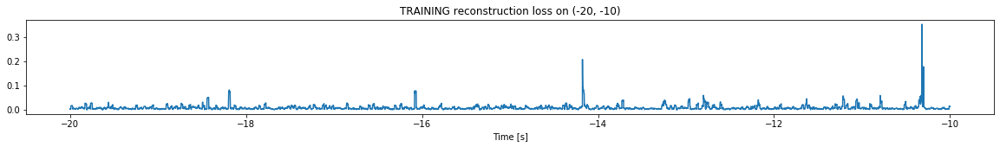

Finished training, median of the log(loss) is:  -2.1310704335399615
Triggering for section:  (-10, 0)
Using this median for triggering: -2.04727934628008


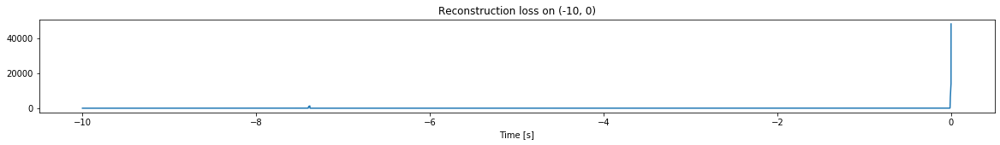

Other trigger time:  [-7.3820996]
Their log loss values are:  [5.16168818]


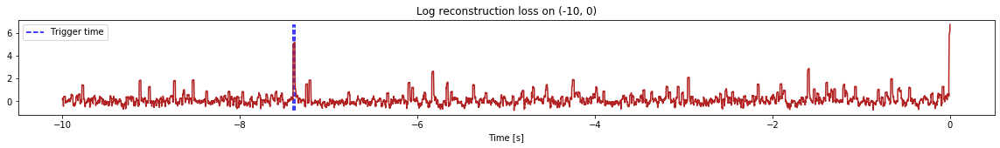

Triggered at:  [-7.3820996]
<--------
Finished simulation, all the triggered times are:  [-7.3820996]


In [29]:
simulation("./data/Ramp30/", 10, (-120,0))